# Objetivo e Resumo do Projeto

O principal objetivo deste projeto é <u>treinar e demonstrar o meu conhecimento sobre modelos supervisionados de regressão</u>. Por esse motivo, me inscrevi em um famoso concurso do Kaggle para aplicar técnicas avançadas de regressão para <u>prever os preços de residências</u> através de um conjunto de dados da cidade de Ames, Iowa (EUA). 

Para avaliação da solução do problema proposto, o concurso exigiu que seja submetido um dataframe com os valores dos preços dos imóveis preditos pelos dados de teste, avaliado pela métrica *Root-Mean-Squared-Log-Error (RMSLE)*. Após a submissão do modelo final, o *RMSLE* atingiu o valor de 0.15681, aproximando muito do desempenho esperado e apresentado pelos modelos desenvolvidos e avaliados por método de validação cruzada neste projeto.

Os principais focos no desenvolvimento, foram as <u>análises exploratórias de dados com suporte de gráficos e visualizações personalizadas</u>, e a preocupação em <u>anular o vazamento de dados</u> em todas as etapas (principalmente nas etapas de validação cruzada, implementadas por pipelines) para que eu pudesse ter a noção real e aproximada do desempenho que a solução teria após a submissão.

# Importações (bibliotecas, dados e funções)

## Bibliotecas

In [178]:
import sys
sys.path.append('../..') #caminho relativo para pasta utils

In [179]:
# Data Description and Handling
import pandas as pd
import numpy as np
import math
from datetime import datetime

# EDA
import utils
import matplotlib.pyplot as plt
import seaborn as sns

# Feature Selection
from sklearn.feature_selection import SelectKBest, mutual_info_regression

# Modeling
from sklearn.model_selection import KFold, cross_validate
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler, MinMaxScaler, PolynomialFeatures, OneHotEncoder, OrdinalEncoder, FunctionTransformer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor

# Save Data Structures
import pickle
import joblib
import dill

import warnings
warnings.filterwarnings('ignore')

## Funções

In [180]:
def print_model_performance_linear_reg(linear_reg_scores):
    mean_rmse = linear_reg_scores['test_RMSE'].mean()
    std_rmse = linear_reg_scores['test_RMSE'].std()

    mean_rmsle = linear_reg_scores['test_RMSLE'].mean()
    std_rmsle = linear_reg_scores['test_RMSLE'].std()

    print(f"Pontuação de validação (RMSE): {+mean_rmse:.3f} ± {+std_rmse:.3f}")
    print(f"Pontuação de validação (RMSLE): {+mean_rmsle:.3f} ± {+std_rmsle:.3f}")
    
    return None


def print_model_performance_bayes_search(bayes_search_obj):
    mean_mae = bayes_search_obj.cv_results_['mean_test_MAE'][bayes_search_obj.best_index_]
    std_mae = bayes_search_obj.cv_results_['std_test_MAE'][bayes_search_obj.best_index_]
    
    mean_rmse = bayes_search_obj.cv_results_['mean_test_RMSE'][bayes_search_obj.best_index_]
    std_rmse = bayes_search_obj.cv_results_['std_test_RMSE'][bayes_search_obj.best_index_]

    mean_rmsle = bayes_search_obj.cv_results_['mean_test_RMSLE'][bayes_search_obj.best_index_]
    std_rmsle = bayes_search_obj.cv_results_['std_test_RMSLE'][bayes_search_obj.best_index_]
    
    print(f"Melhor pontuação de validação (MAE): {-mean_mae:.3f} ± {-std_mae:.3f}")
    print(f"Melhor pontuação de validação (RMSE): {-mean_rmse:.3f} ± {-std_rmse:.3f}")
    print(f"Melhor pontuação de validação (RMSLE): {-mean_rmsle:.3f} ± -{std_rmsle:.3f}")
    
    return None

## Dados

In [181]:
train_df = pd.read_csv('../data/extracted_data/train.csv')
test_df = pd.read_csv('../data/extracted_data/test.csv')

In [182]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [183]:
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


# Descrição e Manipulação de Dados

O objetivo desta etapa no projeto, é conhecer superficialmente os dados que possuo, buscando definir se a base de dados é consistente o suficiente para que seja possível contruir a solução proposta, e para que seja possível explora-la com mais profundidade. Nesta etapa então, busco entender as dimensões dos conjuntos de dados e realizo uma análise de conflitos gerados por valores faltantes e zerados, realizando correções se necessário.

## Significado dos Dados

Os resumos dos dados estão presentes no caminho __../data/data_description.txt__

## Dimensão dos Dados

In [184]:
df_train_shape = train_df.shape
df_test_shape = test_df.shape

print(f'O dataframe de treino possui {df_train_shape[0]} residências (registros) e {df_train_shape[1]} características (variáveis)')
print(f'O dataframe de teste possui {df_test_shape[0]} residências (registros) e {df_test_shape[1]} características (variáveis)')

O dataframe de treino possui 1460 residências (registros) e 81 características (variáveis)
O dataframe de teste possui 1459 residências (registros) e 80 características (variáveis)


## Tipos dos Dados

In [185]:
number_of_features = train_df.shape[1]
pd.options.display.max_rows = number_of_features

In [186]:
train_df[train_df.columns.values].dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


## Checagem de Existência de Dados Duplicados

In [187]:
train_df[train_df.duplicated(subset= ['Id'])]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


- <u>Obs.</u>: O conjunto de dados de treino não possui dados duplicados.

In [188]:
test_df[test_df.duplicated(subset= ['Id'])]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition


- <u>Obs.</u>: O conjunto de dados de teste não possui dados duplicados.

## Manipulação de Conflitos Gerados por Valores Faltantes e Zerados

O objetivo desta etapa é avaliar em cada variável ou em cada grupo de variáveis associadas, através de valores zerados e faltantes, se as regras de imputação de dados foram respeitadas e se seguem um sentido lógico. Caso conflitos sejam identificados, eles precisam ser corrigidos para garantir a consistência dos dados.

A maneira que estruturei a identificação e correção dos conflitos, se baseia nos seguintes questionamentos:
- Quais são as variáveis numéricas e categóricas que não fazem sentido possuir valores faltantes? 
- Quais são as variáveis categóricas que possuem valores faltantes previstos na descrição dos dados e quais não possuem?
- Quais são as variáveis numéricas que possuem (ou não) a probabilidade de assumirem valores zerados?
- Quais são os agrupamentos de variáveis que precisam manter uma relação de valores faltantes e/ou zerados entre si?

Na descrição dos dados existem significados para valores faltantes de algumas variáveis categóricas:

**Alley**: Residencias sem acesso a beco;

**MasVnrType**: Residencias sem revestimento de alvenaria;

**BsmtQual**: Residencias sem porão;

**BsmtCond**: Residencias sem porão;

**BsmtExposure**: Residencias sem porão;

**BsmtFinType1**: Residencias sem porão;

**BsmtFinType2**: Residencias sem porão;

**FireplaceQu**: Residencias sem lareira;

**GarageType**: Residencias sem garagem;

**GarageYrBlt**: Residencias sem garagem;

**GarageFinish**: Residencias sem garagem;

**GarageQual**: Residencias sem garagem;

**GarageCond**: Residencias sem garagem;

**PoolQC**: Residencias sem piscina;

**Fence**: Residencias sem cercagem;

**MiscFeature**: Residencias sem características diferenciada;

Irei tratar a ausência dos dados faltantes na maioria das variáveis, explorando alguns conflitos e identificando regras que deveriam ser respeitadas em cada um dos conjuntos de dados.

### Regras de Imputação de Dados (Dados de Treino)

1. Como a variável **LotFrontage** corresponde ao tamanho da fachada do terreno da residência, não faz sentido que ela possua valores faltantes ou zerados. Logo irei substituir os dados faltantes pela mediana da variável.
2. As variáveis de revestimento de alvernaria: **MasVnrArea** e **MasVnrType**, são variáveis associadas que possuirão uma <u>relação de restrição</u>, onde o registro que possuir a presença de valor zerado na variável **MasVnrArea** impõe que a variável **MasVnrType** possua valor faltante. Se a variável numérica **MasVnrArea** possuir valores faltantes, será atribuído um valor zerado;
3. As variáveis de porão: **BsmtQual**, **BsmtCond**, **TotalBsmtSF**, **BsmtExposure**, **BsmtFinType1**, **BsmtFinType2**, **BsmtFinSF1**, **BsmtFinSF2**, **BsmtUnfSF**, **BsmtFullBath** e **BsmtHalfBath**, são variáveis associadas que possuem relações de restrições, onde:
    - As variáveis categóricas: **BsmtQual**, **BsmtCond**, **BsmtExposure**, **BsmtFinType1** e **BsmtFinType2**, devem possuir a mesma quantidade de valores faltantes que a quantidade de valores zerados da variável **TotalBsmtSF**;
    - As variáveis numéricas: **BsmtFinSF1**, **BsmtFinSF2**, **BsmtUnfSF**, **BsmtFullBath** e **BsmtHalfBath**, devem possuir a mesma quantidade ou mais de valores zerados que **TotalBsmtSF**;
    - Se as variáveis numéricas possuirem valores faltantes, será atribuído um valor zerado;
4. Os valores faltantes da variável de ano de construção de garagem (**GarageYrBuilt**) serão substituídos por um valor bem distante (1800) do valor mínimo encontrado;
5. As variáveis de características diversas da residência (**MiscVal** e **MiscFeature**), são variáveis associadas que possuirão uma <u>relação de restrição</u>, onde o registro que possuir a presença de valor faltante na variável **MiscFeature** impõe que a variável **MisVal** possua valor zerado;
6. Os valores faltantes da variável do sistema elétrico da casa (**Electrical**) será substituída pelo valor que mais se repete da variável.

#### Observações:
1. Uma **relação de restrição** entre variáveis ocorre quando o valor de uma ou mais variáveis é limitado ou condicionado pelo valor de outras variáveis.
2. Para aplicar as relações de restrições identificadas, optei por preservar a maior quantidade de dados inalteradas, ou seja, primeiramente colocar as variáveis associadas em função da variável que possuir menor quantidade de valor faltante ou zerado, e escolher a variável associada principal, a que mais se relaciona com as outras; 

In [189]:
utils.print_missing_values_in_dataframe(train_df)

'LotFrontage' possui 259 registros faltantes (17.74%)
'Alley' possui 1369 registros faltantes (93.77%)
'MasVnrType' possui 872 registros faltantes (59.73%)
'MasVnrArea' possui 8 registros faltantes (0.55%)
'BsmtQual' possui 37 registros faltantes (2.53%)
'BsmtCond' possui 37 registros faltantes (2.53%)
'BsmtExposure' possui 38 registros faltantes (2.60%)
'BsmtFinType1' possui 37 registros faltantes (2.53%)
'BsmtFinType2' possui 38 registros faltantes (2.60%)
'Electrical' possui 1 registros faltantes (0.07%)
'FireplaceQu' possui 690 registros faltantes (47.26%)
'GarageType' possui 81 registros faltantes (5.55%)
'GarageYrBlt' possui 81 registros faltantes (5.55%)
'GarageFinish' possui 81 registros faltantes (5.55%)
'GarageQual' possui 81 registros faltantes (5.55%)
'GarageCond' possui 81 registros faltantes (5.55%)
'PoolQC' possui 1453 registros faltantes (99.52%)
'Fence' possui 1179 registros faltantes (80.75%)
'MiscFeature' possui 1406 registros faltantes (96.30%)


In [190]:
utils.print_zero_values_in_dataframe(train_df)

'MasVnrArea' possui 861 registros zerados (58.97%)
'BsmtFinSF1' possui 467 registros zerados (31.99%)
'BsmtFinSF2' possui 1293 registros zerados (88.56%)
'BsmtUnfSF' possui 118 registros zerados (8.08%)
'TotalBsmtSF' possui 37 registros zerados (2.53%)
'2ndFlrSF' possui 829 registros zerados (56.78%)
'LowQualFinSF' possui 1434 registros zerados (98.22%)
'BsmtFullBath' possui 856 registros zerados (58.63%)
'BsmtHalfBath' possui 1378 registros zerados (94.38%)
'FullBath' possui 9 registros zerados (0.62%)
'HalfBath' possui 913 registros zerados (62.53%)
'BedroomAbvGr' possui 6 registros zerados (0.41%)
'KitchenAbvGr' possui 1 registros zerados (0.07%)
'Fireplaces' possui 690 registros zerados (47.26%)
'GarageCars' possui 81 registros zerados (5.55%)
'GarageArea' possui 81 registros zerados (5.55%)
'WoodDeckSF' possui 761 registros zerados (52.12%)
'OpenPorchSF' possui 656 registros zerados (44.93%)
'EnclosedPorch' possui 1252 registros zerados (85.75%)
'3SsnPorch' possui 1436 registros z

In [191]:
# 1)
median_lotfrontage = train_df['LotFrontage'].median()
train_df['LotFrontage'] = train_df['LotFrontage'].apply(lambda x: median_lotfrontage if np.isnan(x) else x)

In [192]:
# 2)
train_df['MasVnrArea'].fillna(float(0), inplace= True)
train_df['MasVnrType'].loc[(train_df['MasVnrArea'] == 0)] = np.nan
train_df['MasVnrType'].loc[(train_df['MasVnrArea'] != 0) & (train_df['MasVnrType'].isna())] = train_df['MasVnrType'].loc[(train_df['MasVnrArea'] != 0)].mode()[0]

In [193]:
# 3)
# Atribuindo valor zero para variáveis numéricas quando TotalBsmtSF possuir valor faltante
train_df.loc[train_df['TotalBsmtSF'].isna(), ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 
                                              'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']] = float(0)

# Atribuindo valores faltantes para variáveis categóricas quando TotalBsmtSF for zero
train_df.loc[train_df['TotalBsmtSF'] == 0, ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']] = np.nan

#Atribuindo o valor que mais se repete da variável categórica quando possuir mais valores faltantes que valores zerados de TotalBsmtSF
def fill_missing_values_bsmt_categorical_vars(categorical_vars, dataframe):
    for var in categorical_vars:
        if dataframe[var].loc[(dataframe['TotalBsmtSF'] > 0) & (dataframe[var].isna())].shape[0] > 0:
            mode_value = dataframe[var].loc[(dataframe['TotalBsmtSF'] > 0)].mode(dropna= True)
            if not mode_value.empty:
                dataframe[var].loc[(dataframe['TotalBsmtSF'] > 0) & (dataframe[var].isna())] = mode_value[0]
    return None

bsmt_categorical_vars = ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']
fill_missing_values_bsmt_categorical_vars(bsmt_categorical_vars, train_df)

In [194]:
# 4)
train_df['GarageYrBlt'].fillna(1800, inplace= True)

In [195]:
# 5)
train_df['MiscVal'].loc[train_df['MiscFeature'].isna()] = float(0)
train_df['MiscVal'].loc[(train_df['MiscVal'] == 0) & (train_df['MiscFeature'].notna())] = train_df['MiscVal'].loc[(train_df['MiscFeature'].notna())].median()

In [196]:
# 6) 
cat_vars_meaningless_missing_data = ['Electrical']

for var in cat_vars_meaningless_missing_data:
    train_df[var].fillna(train_df[var].mode()[0], inplace=True)

In [197]:
utils.print_missing_values_in_dataframe(train_df)

'Alley' possui 1369 registros faltantes (93.77%)
'MasVnrType' possui 869 registros faltantes (59.52%)
'BsmtQual' possui 37 registros faltantes (2.53%)
'BsmtCond' possui 37 registros faltantes (2.53%)
'BsmtExposure' possui 37 registros faltantes (2.53%)
'BsmtFinType1' possui 37 registros faltantes (2.53%)
'BsmtFinType2' possui 37 registros faltantes (2.53%)
'FireplaceQu' possui 690 registros faltantes (47.26%)
'GarageType' possui 81 registros faltantes (5.55%)
'GarageFinish' possui 81 registros faltantes (5.55%)
'GarageQual' possui 81 registros faltantes (5.55%)
'GarageCond' possui 81 registros faltantes (5.55%)
'PoolQC' possui 1453 registros faltantes (99.52%)
'Fence' possui 1179 registros faltantes (80.75%)
'MiscFeature' possui 1406 registros faltantes (96.30%)


In [198]:
utils.print_zero_values_in_dataframe(train_df)

'MasVnrArea' possui 869 registros zerados (59.52%)
'BsmtFinSF1' possui 467 registros zerados (31.99%)
'BsmtFinSF2' possui 1293 registros zerados (88.56%)
'BsmtUnfSF' possui 118 registros zerados (8.08%)
'TotalBsmtSF' possui 37 registros zerados (2.53%)
'2ndFlrSF' possui 829 registros zerados (56.78%)
'LowQualFinSF' possui 1434 registros zerados (98.22%)
'BsmtFullBath' possui 856 registros zerados (58.63%)
'BsmtHalfBath' possui 1378 registros zerados (94.38%)
'FullBath' possui 9 registros zerados (0.62%)
'HalfBath' possui 913 registros zerados (62.53%)
'BedroomAbvGr' possui 6 registros zerados (0.41%)
'KitchenAbvGr' possui 1 registros zerados (0.07%)
'Fireplaces' possui 690 registros zerados (47.26%)
'GarageCars' possui 81 registros zerados (5.55%)
'GarageArea' possui 81 registros zerados (5.55%)
'WoodDeckSF' possui 761 registros zerados (52.12%)
'OpenPorchSF' possui 656 registros zerados (44.93%)
'EnclosedPorch' possui 1252 registros zerados (85.75%)
'3SsnPorch' possui 1436 registros z

<u>Obs.</u>: Após identificar conflitos e aplicar regras de imputação de dados, posso afirmar que os dados de treino estão consistentes, pois os dados faltantes estão apenas nas variáveis categóricas previstas, os dados zerados nas variáveis numéricas possíveis.

### Regras de Imputação de Dados (Dados de Teste)

Todas as regras de imputação de dados criadas para o conjunto de treino, também serão implementadas no conjunto de dados de teste. Apenas os tópico 4 e 6 ganharão adições, onde:

4. As variáveis de garagem (**GarageType**, **GarageFinish**, **GarageQual** e **GarageCond**, **GarageYrBlt**, **GarageCars** e **GarageArea**), são variáveis que se associam entre si, possuindo <u>relações de restrições</u>, onde:
    - As variáveis categóricas: **GarageType**, **GarageFinish**, **GarageQual** e **GarageCond**, devem possuir a mesma quantidade de valores faltantes que a quantidade de valores zerados da variável **GarageArea**;
    - As variáveis numéricas: **GarageCars** e **GarageYrBuilt**, devem possuir a mesma quantidade de valores zerados que **GarageArea**.
    - Se as variáveis numéricas possuirem valores faltantes, será atribuído um valor zerado.
    - Para a variável **GarageYrBuilt** substituirei seus valores zerados por 1800 (século anterior do ano em que o primeiro imóvel foi construído).
    
6) Os valores faltantes das variáveis independentes **MSZoning**, **Utilities**, **Exterior1st**, **Exterior2nd**, **KitchenQual**, **Functional**, **Electrical** e **SaleType** serão substituídos pelo valor que mais se repete de cada variável.

In [199]:
utils.print_missing_values_in_dataframe(test_df)

'MSZoning' possui 4 registros faltantes (0.27%)
'LotFrontage' possui 227 registros faltantes (15.56%)
'Alley' possui 1352 registros faltantes (92.67%)
'Utilities' possui 2 registros faltantes (0.14%)
'Exterior1st' possui 1 registros faltantes (0.07%)
'Exterior2nd' possui 1 registros faltantes (0.07%)
'MasVnrType' possui 894 registros faltantes (61.27%)
'MasVnrArea' possui 15 registros faltantes (1.03%)
'BsmtQual' possui 44 registros faltantes (3.02%)
'BsmtCond' possui 45 registros faltantes (3.08%)
'BsmtExposure' possui 44 registros faltantes (3.02%)
'BsmtFinType1' possui 42 registros faltantes (2.88%)
'BsmtFinSF1' possui 1 registros faltantes (0.07%)
'BsmtFinType2' possui 42 registros faltantes (2.88%)
'BsmtFinSF2' possui 1 registros faltantes (0.07%)
'BsmtUnfSF' possui 1 registros faltantes (0.07%)
'TotalBsmtSF' possui 1 registros faltantes (0.07%)
'BsmtFullBath' possui 2 registros faltantes (0.14%)
'BsmtHalfBath' possui 2 registros faltantes (0.14%)
'KitchenQual' possui 1 registros 

In [200]:
utils.print_zero_values_in_dataframe(test_df)

'MasVnrArea' possui 877 registros zerados (60.11%)
'BsmtFinSF1' possui 462 registros zerados (31.67%)
'BsmtFinSF2' possui 1278 registros zerados (87.59%)
'BsmtUnfSF' possui 123 registros zerados (8.43%)
'TotalBsmtSF' possui 41 registros zerados (2.81%)
'2ndFlrSF' possui 839 registros zerados (57.51%)
'LowQualFinSF' possui 1445 registros zerados (99.04%)
'BsmtFullBath' possui 849 registros zerados (58.19%)
'BsmtHalfBath' possui 1364 registros zerados (93.49%)
'FullBath' possui 3 registros zerados (0.21%)
'HalfBath' possui 921 registros zerados (63.13%)
'BedroomAbvGr' possui 2 registros zerados (0.14%)
'KitchenAbvGr' possui 2 registros zerados (0.14%)
'Fireplaces' possui 730 registros zerados (50.03%)
'GarageCars' possui 76 registros zerados (5.21%)
'GarageArea' possui 76 registros zerados (5.21%)
'WoodDeckSF' possui 762 registros zerados (52.23%)
'OpenPorchSF' possui 642 registros zerados (44.00%)
'EnclosedPorch' possui 1208 registros zerados (82.80%)
'3SsnPorch' possui 1446 registros z

In [201]:
# 1)
median_lotfrontage = test_df['LotFrontage'].median()
test_df['LotFrontage'] = test_df['LotFrontage'].apply(lambda x: median_lotfrontage if np.isnan(x) else x)

In [202]:
# 2)
test_df['MasVnrArea'].fillna(float(0), inplace= True)
test_df['MasVnrType'].loc[(test_df['MasVnrArea'] == 0)] = np.nan
test_df['MasVnrType'].loc[(test_df['MasVnrArea'] != 0) & (test_df['MasVnrType'].isna())] = test_df['MasVnrType'].loc[(test_df['MasVnrArea'] != 0)].mode()[0]

In [203]:
# 3)
# Atribuindo valor zero para variáveis numéricas quando TotalBsmtSF possuir valor faltante
test_df.loc[test_df['TotalBsmtSF'].isna(), ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 
                                            'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']] = 0

# Atribuindo valores faltantes para variáveis categóricas quando TotalBsmtSF for zero
test_df.loc[test_df['TotalBsmtSF'] == 0, ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']] = np.nan

#Atribuindo o valor que mais se repete da variável categórica quando possuir mais valores faltantes que valores zerados de TotalBsmtSF
fill_missing_values_bsmt_categorical_vars(bsmt_categorical_vars, test_df)

test_df.loc[test_df['BsmtFullBath'].isna(), 'BsmtFullBath'] = 0
test_df.loc[test_df['BsmtHalfBath'].isna(), 'BsmtHalfBath'] = 0

In [204]:
# 4)
# Atribuindo valor zero para variáveis numéricas quando GarageArea possuir valor faltante
test_df.loc[test_df['GarageArea'].isna(), ['GarageCars', 'GarageArea']] = float(0)

# Atribuindo valores faltantes para variáveis categóricas quando GarageArea for zero
test_df.loc[test_df['GarageArea'] == 0, ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']] = np.nan

#Atribuindo o valor que mais se repete da variável categórica quando possuir mais valores faltantes que valores zerados de GarageArea
def fill_missing_values_garage_categorical_vars(categorical_vars, dataframe):
    for var in categorical_vars:
        if dataframe[var].loc[(dataframe['GarageArea'] > 0) & (dataframe[var].isna())].shape[0] > 0:
            mode_value = dataframe[var].mode(dropna= True)
            if not mode_value.empty:
                dataframe[var].loc[(dataframe['GarageArea'] > 0) & (dataframe[var].isna())] = mode_value[0]
    return None

garage_categorical_vars = ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']
fill_missing_values_garage_categorical_vars(garage_categorical_vars, test_df)

test_df.loc[test_df['GarageYrBlt'].isna(), 'GarageYrBlt'] = 1800

In [205]:
# 5)
test_df['MiscVal'].loc[test_df['MiscFeature'].isna()] = float(0)
test_df['MiscVal'].loc[(test_df['MiscVal'] == 0) & (test_df['MiscFeature'].notna())] = test_df['MiscVal'].loc[(test_df['MiscFeature'].notna())].median()

In [206]:
# 6) 
cat_vars_meaningless_missing_data = ['MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'KitchenQual', 'Functional', 'Electrical', 'SaleType']

for var in cat_vars_meaningless_missing_data:
    test_df[var].fillna(test_df[var].mode()[0], inplace=True)

In [207]:
utils.print_missing_values_in_dataframe(test_df)

'Alley' possui 1352 registros faltantes (92.67%)
'MasVnrType' possui 892 registros faltantes (61.14%)
'BsmtQual' possui 42 registros faltantes (2.88%)
'BsmtCond' possui 42 registros faltantes (2.88%)
'BsmtExposure' possui 42 registros faltantes (2.88%)
'BsmtFinType1' possui 42 registros faltantes (2.88%)
'BsmtFinType2' possui 42 registros faltantes (2.88%)
'FireplaceQu' possui 730 registros faltantes (50.03%)
'GarageType' possui 77 registros faltantes (5.28%)
'GarageFinish' possui 77 registros faltantes (5.28%)
'GarageQual' possui 77 registros faltantes (5.28%)
'GarageCond' possui 77 registros faltantes (5.28%)
'PoolQC' possui 1456 registros faltantes (99.79%)
'Fence' possui 1169 registros faltantes (80.12%)
'MiscFeature' possui 1408 registros faltantes (96.50%)


In [208]:
utils.print_zero_values_in_dataframe(test_df)

'MasVnrArea' possui 892 registros zerados (61.14%)
'BsmtFinSF1' possui 463 registros zerados (31.73%)
'BsmtFinSF2' possui 1279 registros zerados (87.66%)
'BsmtUnfSF' possui 124 registros zerados (8.50%)
'TotalBsmtSF' possui 42 registros zerados (2.88%)
'2ndFlrSF' possui 839 registros zerados (57.51%)
'LowQualFinSF' possui 1445 registros zerados (99.04%)
'BsmtFullBath' possui 851 registros zerados (58.33%)
'BsmtHalfBath' possui 1366 registros zerados (93.63%)
'FullBath' possui 3 registros zerados (0.21%)
'HalfBath' possui 921 registros zerados (63.13%)
'BedroomAbvGr' possui 2 registros zerados (0.14%)
'KitchenAbvGr' possui 2 registros zerados (0.14%)
'Fireplaces' possui 730 registros zerados (50.03%)
'GarageCars' possui 77 registros zerados (5.28%)
'GarageArea' possui 77 registros zerados (5.28%)
'WoodDeckSF' possui 762 registros zerados (52.23%)
'OpenPorchSF' possui 642 registros zerados (44.00%)
'EnclosedPorch' possui 1208 registros zerados (82.80%)
'3SsnPorch' possui 1446 registros z

<u>Obs.</u>: Após identificar conflitos e aplicar regras de imputação de dados, posso afirmar que os dados de teste estão consistentes, pois os dados faltantes estão apenas nas variáveis categóricas previstas, e os dados zerados nas variáveis numéricas possíveis.

## Substituição de Valores Faltantes

In [209]:
# Substituindo valores faltantes das variáveis categóricas por 'None'
train_df.fillna('None', inplace= True)
test_df.fillna('None', inplace= True)

## Criação de Variáveis

Observei a existência de 4 variáveis (**OpenPorchSF**, **EnclosedPorch**, **3SsnPorch**, **ScreenPorch**) para declarar a área de tipos de varandas diferentes, que acabam possuindo uma grande quantidade de valores zerados. Para contornar esse problema, decidi criar novas variáveis associando as variáveis de área de varanda.

In [210]:
# HasPorch: 'Yes' se existir varanda declarada em pelo menos uma das variáveis de varanda. Caso contrário, 'No'.
train_df['HasPorch'] = train_df[['OpenPorchSF', 'EnclosedPorch', 
                                 '3SsnPorch', 'ScreenPorch']].apply(lambda row:'Yes' if row.any() 
                                                                               else 'No', axis=1)
test_df['HasPorch'] = test_df[['OpenPorchSF', 'EnclosedPorch', 
                               '3SsnPorch', 'ScreenPorch']].apply(lambda row:'Yes' if row.any()
                                                                             else 'No', axis=1)
# CountPorch: quantidade de varanda existente por imóvel.
train_df['CountPorch'] = train_df[['OpenPorchSF', 'EnclosedPorch', 
                                   '3SsnPorch', 'ScreenPorch']].astype(bool).sum(axis=1)
test_df['CountPorch'] = test_df[['OpenPorchSF', 'EnclosedPorch', 
                                 '3SsnPorch', 'ScreenPorch']].astype(bool).sum(axis=1)

# TotalPorchSF: área total das varandas de um imóvel.
train_df['TotalPorchSF'] = train_df[['OpenPorchSF', 'EnclosedPorch', 
                                     '3SsnPorch', 'ScreenPorch']].sum(axis=1)
test_df['TotalPorchSF'] = test_df[['OpenPorchSF', 'EnclosedPorch', 
                                   '3SsnPorch', 'ScreenPorch']].sum(axis=1)

## Alteração de Tipos de Variáveis 

In [211]:
# Transformando algumas variáveis de tipo "integer" em tipo "category"
integer_variables_to_category_type = ['MSSubClass', 'OverallQual', 'OverallCond']
train_df[integer_variables_to_category_type] = train_df[integer_variables_to_category_type].astype('category')
test_df[integer_variables_to_category_type] = test_df[integer_variables_to_category_type].astype('category')

# Transformando algumas variáveis em tipo "integer"
variables_to_integer_type = ['GarageYrBlt']
train_df[variables_to_integer_type] = train_df[variables_to_integer_type].astype(int)
test_df[variables_to_integer_type] = test_df[variables_to_integer_type].astype(int) 

# Transformando o restante das variáveis de tipo "object" para tipo "category"
object_columns = train_df.select_dtypes(include=['object']).columns
train_df[object_columns] = train_df[object_columns].astype('category')

object_columns = test_df.select_dtypes(include=['object']).columns
test_df[object_columns] = test_df[object_columns].astype('category')

## Nota:
- Como os dados faltantes possuem significado, e as variáveis associadas estão em conformidade em relação aos valores faltantes e ausentes, não considerei a exclusão de qualquer registro, apenas transformei os dados faltantes em tipos aceitáveis, pois os registros serão utéis;
- Como a base de dados apresentou pouquíssimos registros com conflitos, e que foram tratados, irei assumir que **os conjuntos de dados são consistentes**.

# Análise Exploratória de Dados

Na análise exploratória de dados busco entender a estrutura dos dados de forma mais aprofundada, descobrindo e comparando padrões, detectando outliers, e verificando suposições com a ajuda de teste de estatísticos, estatísticas resumidas e representações gráficas.

<u>Obs.</u>: Em toda AED, também verifiquei os comportamentos das variáveis dos dados de teste, comparando-as com as variáveis do conjunto de treino, analisando se os conjuntos seguem comportamentos próximos ou parecidos. Porém, decidi remover as distribuições dos dados de teste para reduzir o tamanho do projeto.

## Análise Univariada

### Variáveis Quantitativas

- **Variável resposta/alvo**: SalePrice;
- **Variáveis quantitativas contínuas**: LotFrontage, LotArea, MasVnrArea, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, GarageArea, WoodDeckSF, OpenPorchSF, EnclosedPorch, ScreenPorch e TotalPorchSF;
- **Variáveis quantitativas discretas**: YearBuilt, YearRemodAdd, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, TotRmsAbvGrd, Fireplaces, GarageYrBlt, GarageCars, MoSold, YrSold e CountPorch;

<u>Obs.</u>: 
1. As variáveis qualitativas numéricas serão abordadas no tópico: **Qualitative Variables** e seus tipos já foram alterados para 'category' no tópido **Change Data Types**.
    - **Variáveis qualitativas nominais numéricas**: MSSubClass;
    - **Variáveis qualitativas ordinais numéricas**: OverallQual, OverallCond;

In [212]:
target_var_train_df = train_df[['SalePrice']]

quantitative_vars_train_df = train_df.select_dtypes(include= ['int64', 'float64'])
quantitative_vars_train_df.drop(columns= ['SalePrice', 'Id'], inplace= True)

#### Variável Alvo

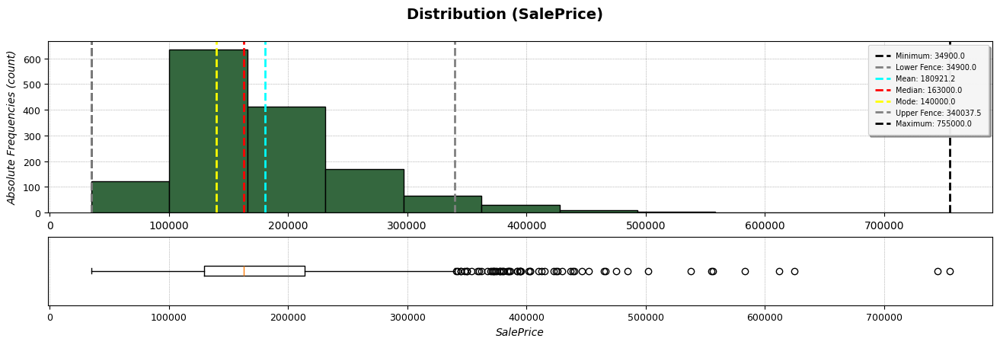

In [213]:
# Dados de Treino
utils.plot_continuous_variables_distributions(target_var_train_df)

In [214]:
utils.descriptive_statistics_continuous_variables(target_var_train_df)

,Valores Únicos,Desv. Padrão,Variância,Assimetria,Curtose,Normalidade (p-value)
SalePrice,663,79442.503,6.311111e+09,1.883,6.536,6.402140e-20


In [215]:
# Tratando os outliers dos dados de treino pelo método Winsorization
utils.treat_outliers_by_percentile_capping(target_var_train_df, ['SalePrice'])

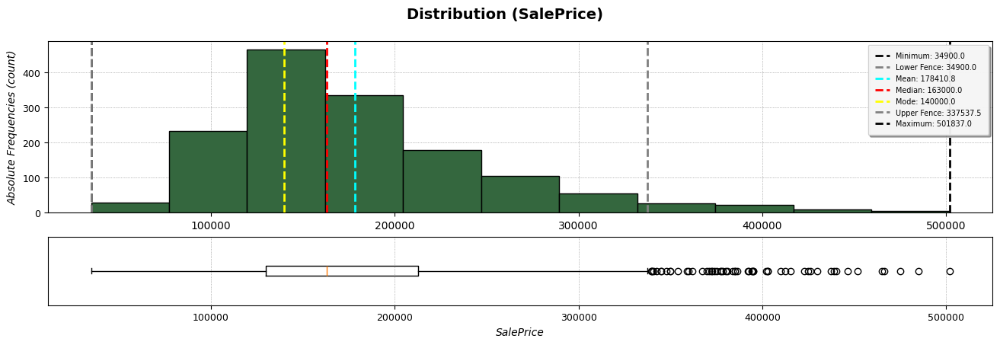

In [216]:
# Dados de Treino com Outliers tratados 
utils.plot_continuous_variables_distributions(target_var_train_df)

In [217]:
utils.descriptive_statistics_continuous_variables(target_var_train_df)

,Valores Únicos,Desv. Padrão,Variância,Assimetria,Curtose,Normalidade (p-value)
SalePrice,655,72176.65,5.209469e+09,1.242,1.908,1.600942e-16


#### Variáveis Contínuas

In [218]:
list_continuous_vars = ['LotFrontage', 'MasVnrArea', 'LotArea', 'BsmtFinSF1', 'BsmtFinSF2', 
                        'BsmtUnfSF', 'TotalBsmtSF',  '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 
                        'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch',
                        '3SsnPorch','ScreenPorch', 'PoolArea', 'MiscVal', 'TotalPorchSF']

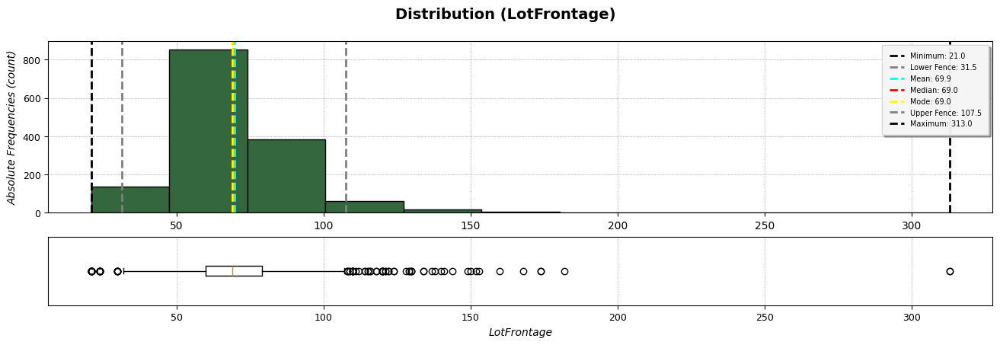

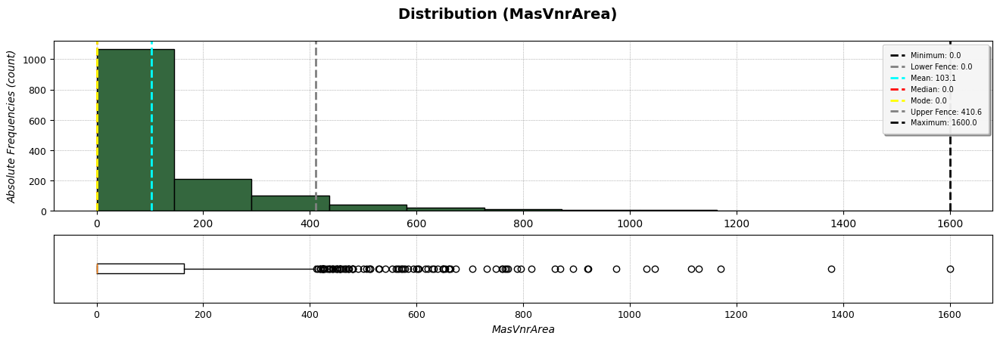

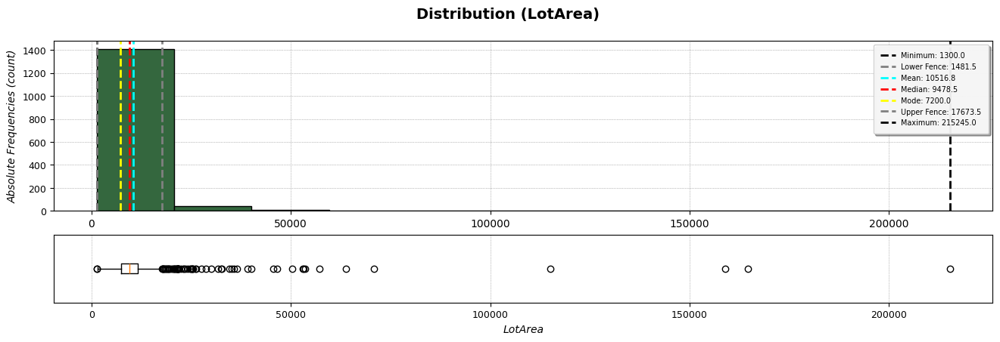

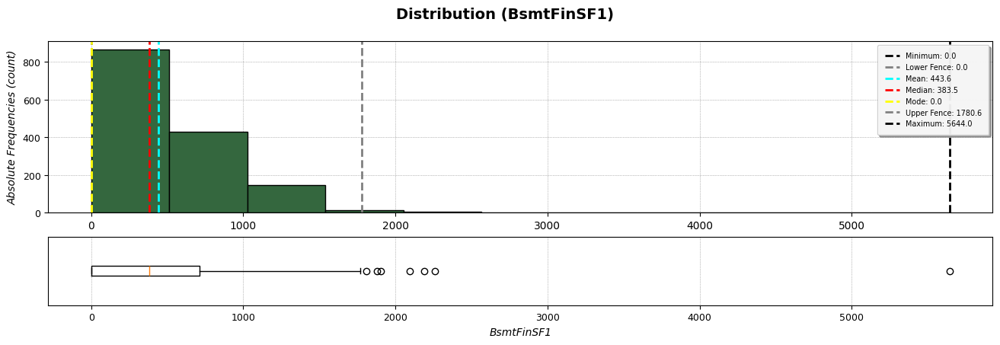

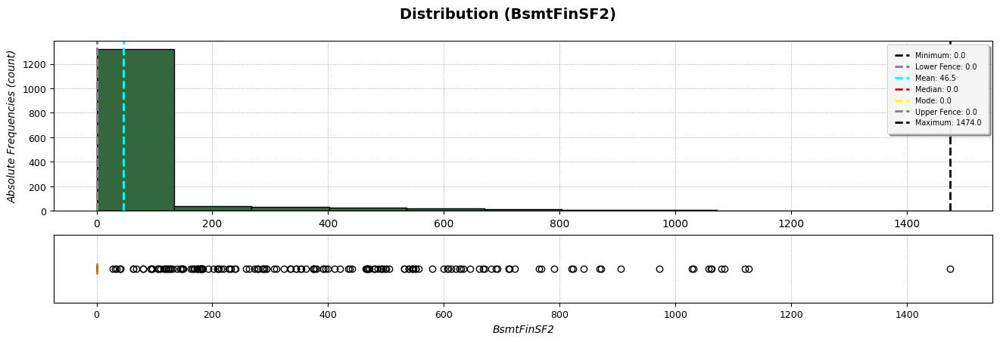

...

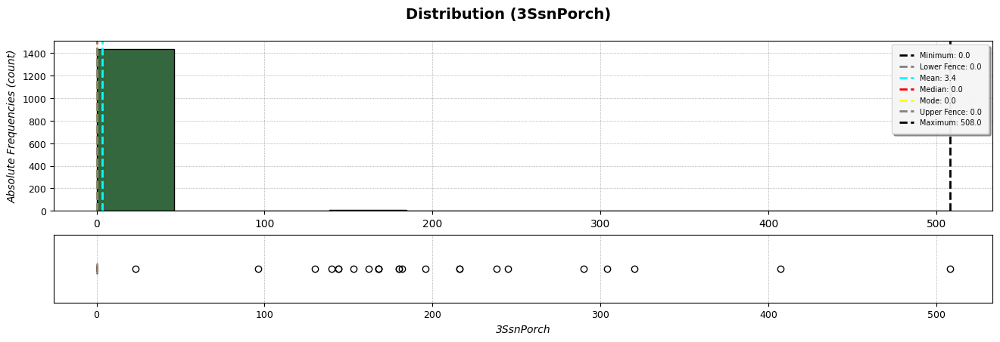

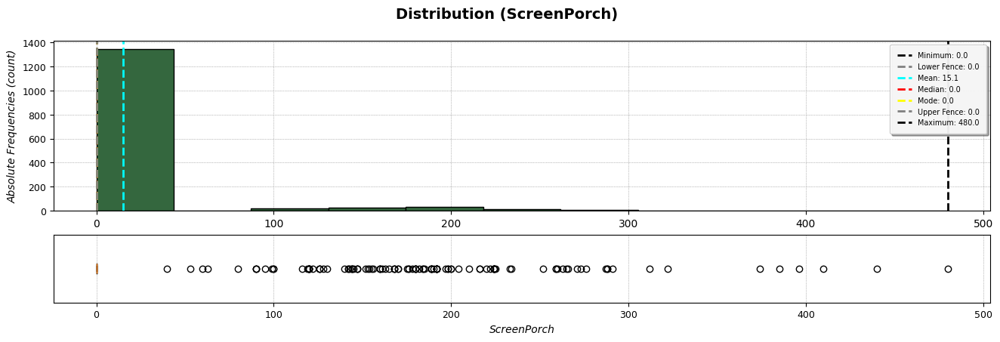

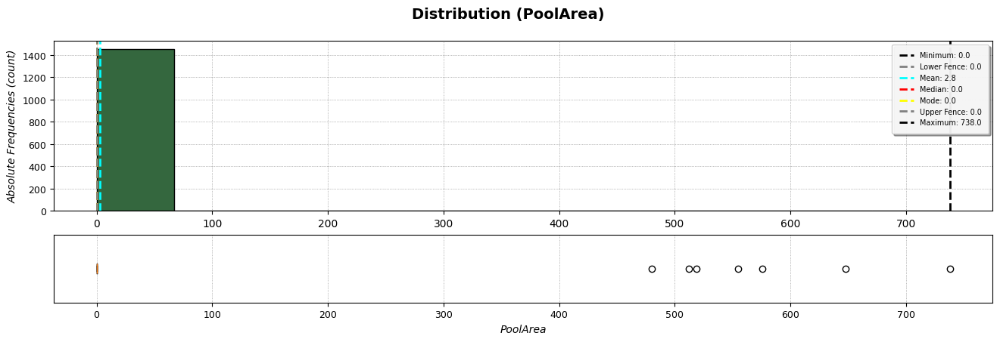

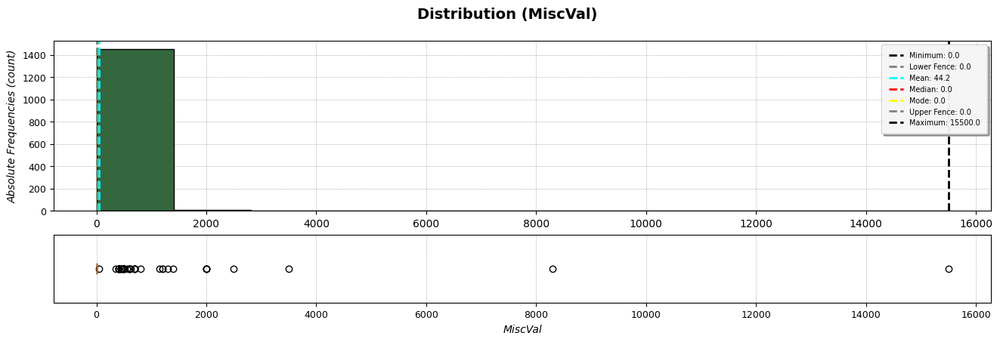

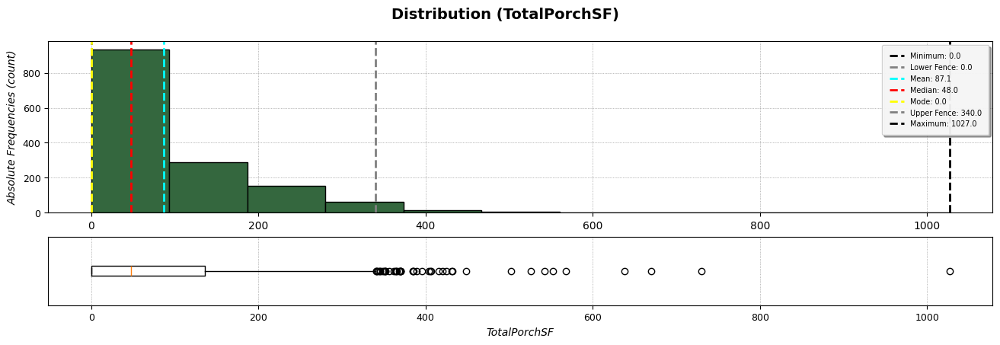

In [219]:
# Dados de Treino
utils.plot_continuous_variables_distributions(quantitative_vars_train_df[list_continuous_vars])

In [220]:
utils.descriptive_statistics_continuous_variables(quantitative_vars_train_df[list_continuous_vars])

,Valores Únicos,Desv. Padrão,Variância,Assimetria,Curtose,Normalidade (p-value)
LotFrontage,110,22.028,4.852190e+02,2.409,21.913,1.680656e-23
MasVnrArea,327,180.731,3.266383e+04,2.678,10.141,4.898300e-126
LotArea,1073,9981.265,9.962565e+07,12.208,203.243,7.582061e-82
BsmtFinSF1,637,456.098,2.080255e+05,1.686,11.118,2.544827e-35
BsmtFinSF2,144,161.319,2.602391e+04,4.255,20.113,0.000000e+00
BsmtUnfSF,780,441.867,1.952464e+05,0.920,0.475,4.799194e-13
TotalBsmtSF,721,438.705,1.924624e+05,1.524,13.250,9.069791e-08
1stFlrSF,753,386.588,1.494501e+05,1.377,5.746,4.791030e-10
2ndFlrSF,417,436.528,1.905571e+05,0.813,-0.553,1.066823e-164
LowQualFinSF,24,48.623,2.364204e+03,9.011,83.235,0.000000e+00


In [221]:
# Tratando os outliers dos dados de treino pelo método Winsorization
list_continuous_vars.remove('PoolArea')

utils.treat_outliers_by_percentile_capping(quantitative_vars_train_df, list_continuous_vars)

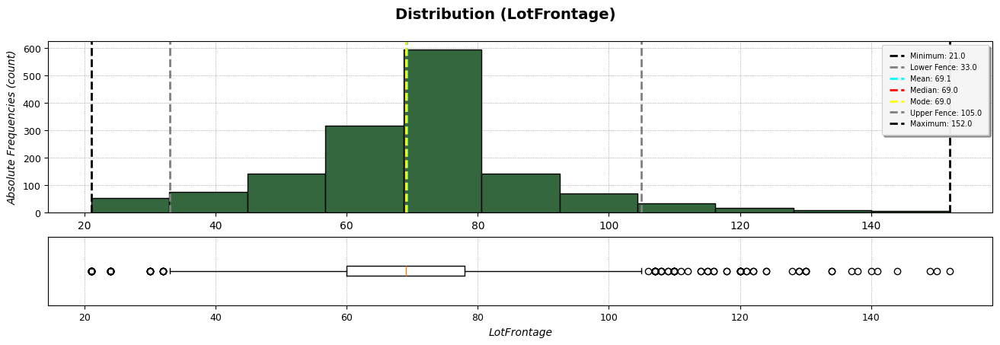

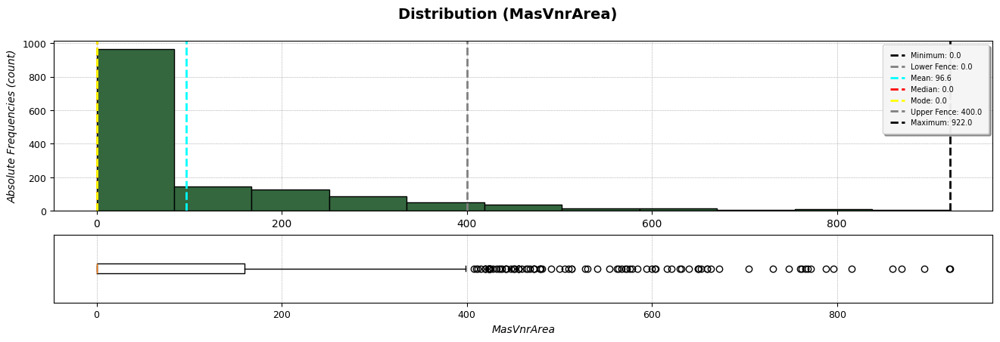

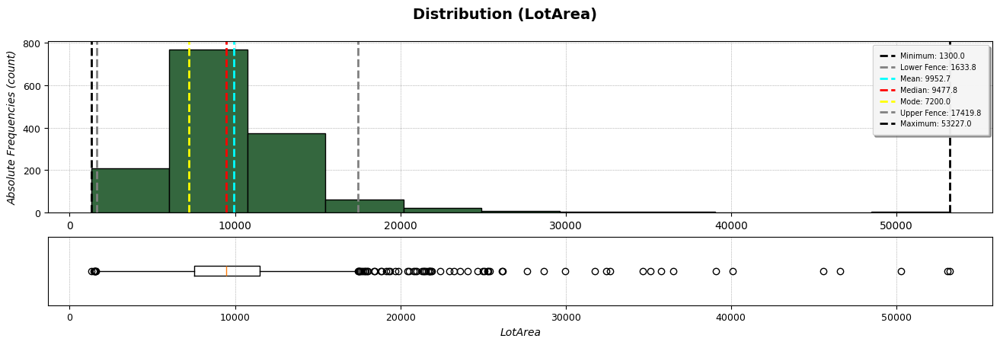

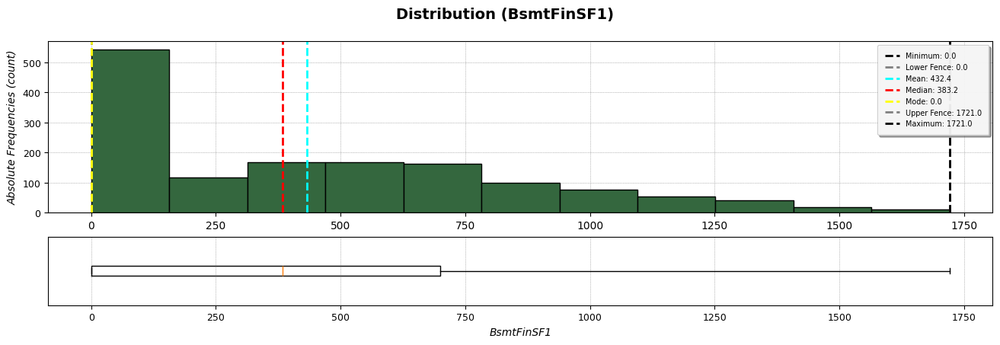

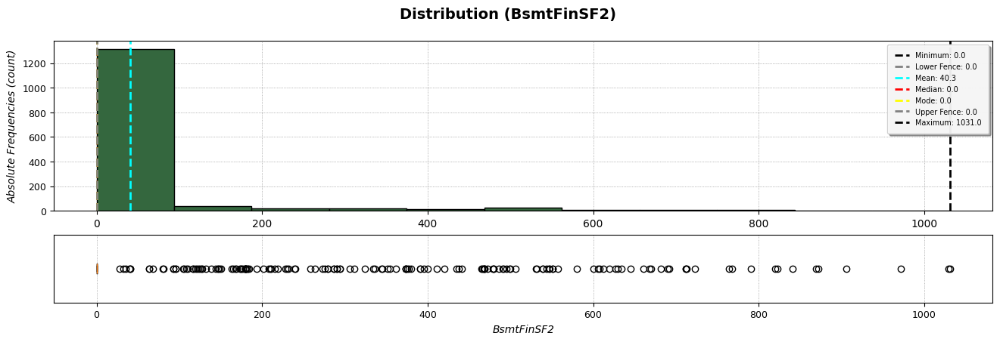

...

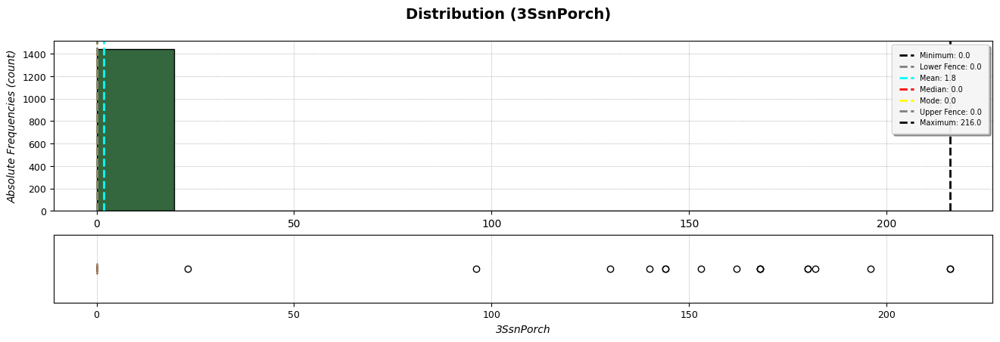

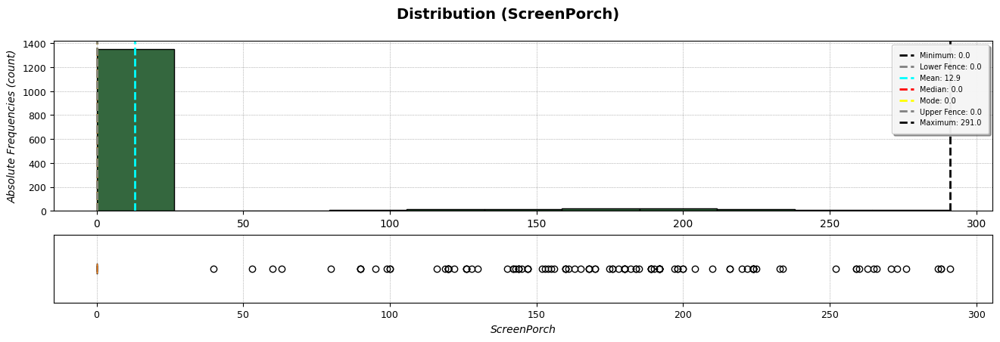

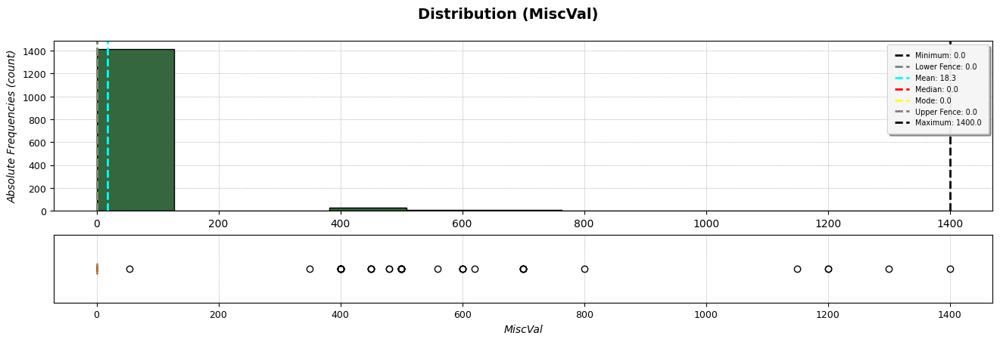

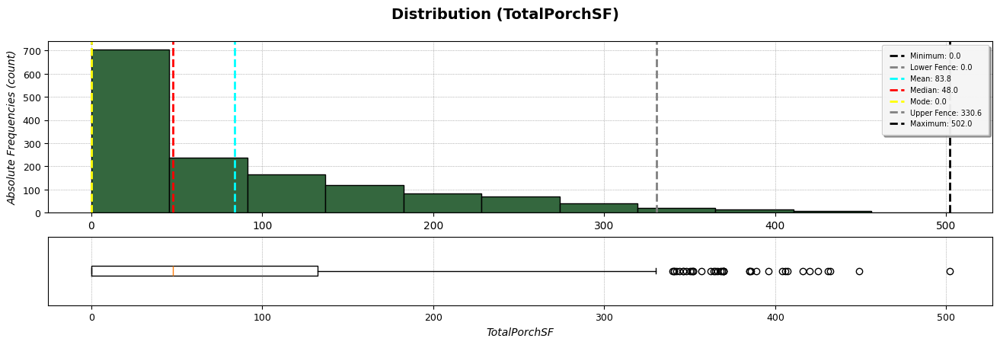

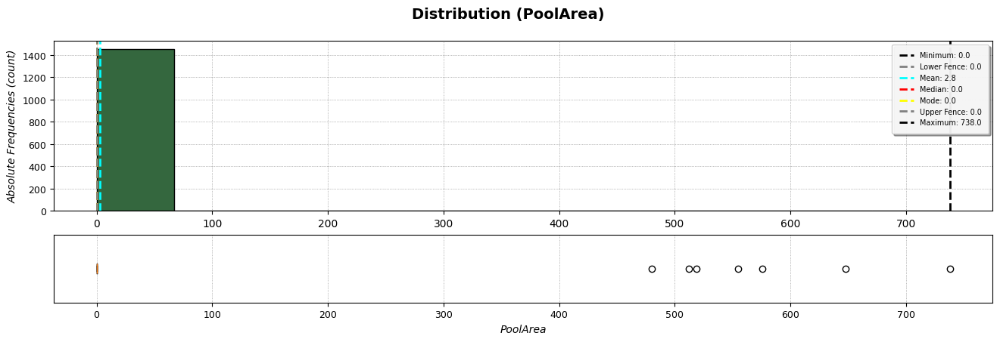

In [222]:
# Dados de Treino com Outliers Tratados
list_continuous_vars.append('PoolArea')

utils.plot_continuous_variables_distributions(quantitative_vars_train_df[list_continuous_vars])

In [223]:
utils.descriptive_statistics_continuous_variables(quantitative_vars_train_df[list_continuous_vars])

,Valores Únicos,Desv. Padrão,Variância,Assimetria,Curtose,Normalidade (p-value)
LotFrontage,104,19.059,3.632440e+02,0.400,1.927,4.827192e-20
MasVnrArea,319,161.572,2.610546e+04,2.067,4.543,1.476216e-138
LotArea,1066,4948.261,2.448529e+07,3.020,18.675,1.619392e-22
BsmtFinSF1,630,421.673,1.778081e+05,0.681,-0.460,1.039808e-38
BsmtFinSF2,136,139.378,1.942627e+04,4.005,16.729,0.000000e+00
BsmtUnfSF,773,427.390,1.826620e+05,0.833,0.149,4.648738e-12
TotalBsmtSF,714,397.764,1.582162e+05,0.222,0.603,4.244129e-06
1stFlrSF,746,357.826,1.280394e+05,0.686,0.102,2.792206e-09
2ndFlrSF,409,424.839,1.804882e+05,0.748,-0.886,7.366089e-170
LowQualFinSF,16,31.005,9.613050e+02,11.247,131.020,0.000000e+00


#### Variáveis Discretas

In [224]:
list_discrete_vars = ['YearBuilt', 'YearRemodAdd', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 
                      'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
                      'GarageYrBlt', 'GarageCars', 'MoSold', 'YrSold', 'CountPorch']

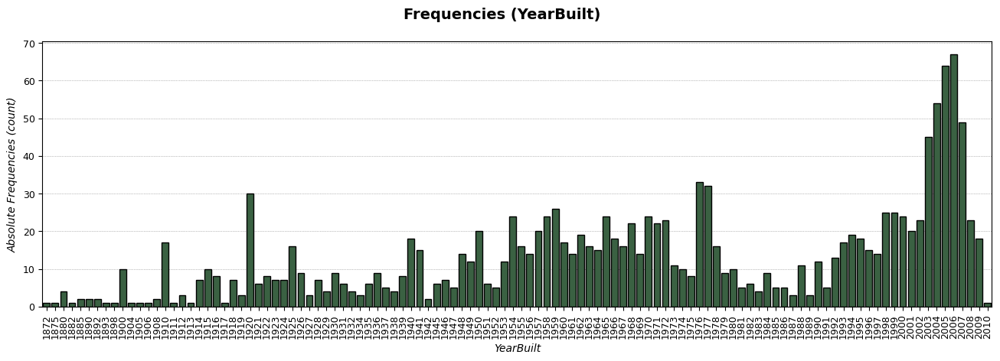

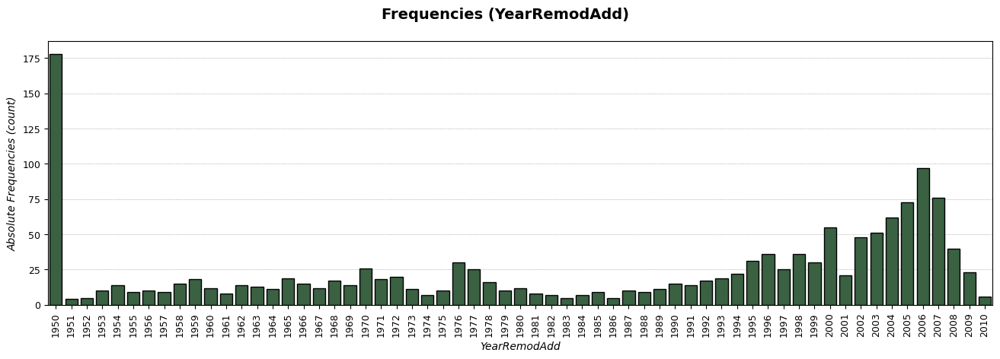

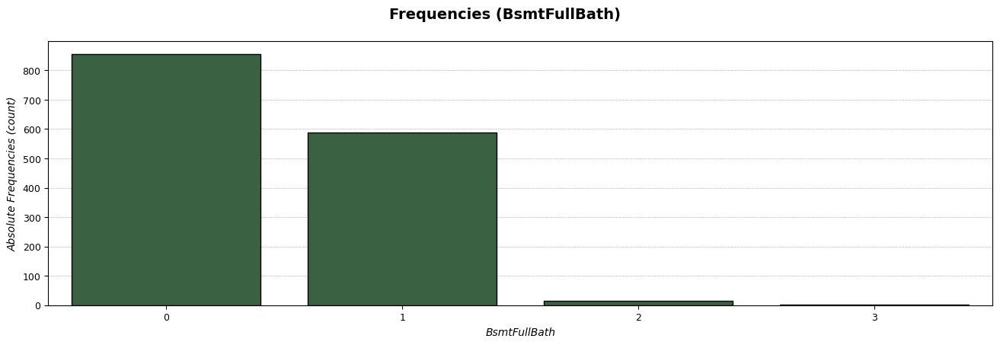

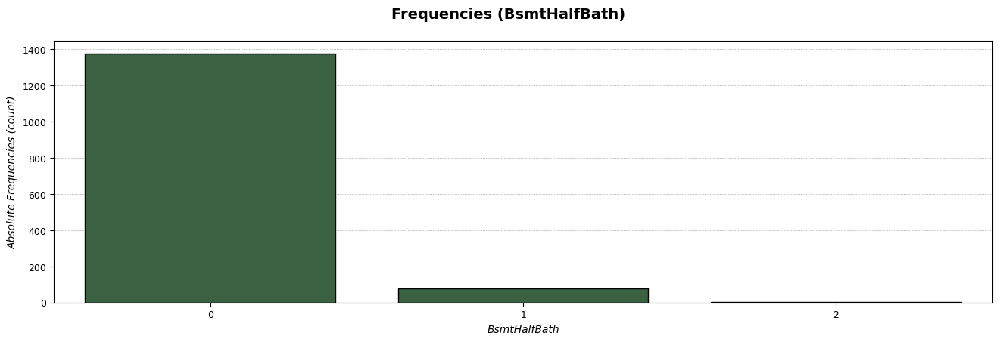

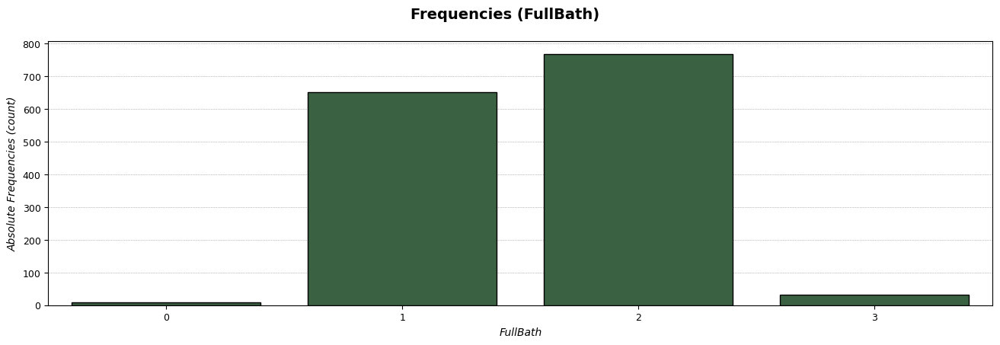

...

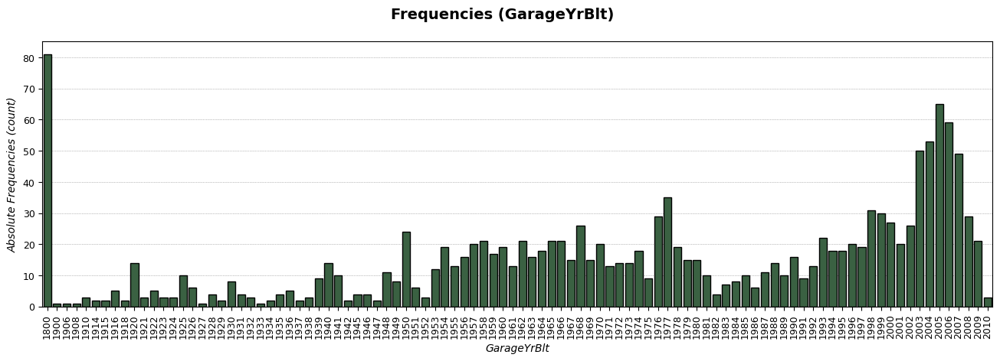

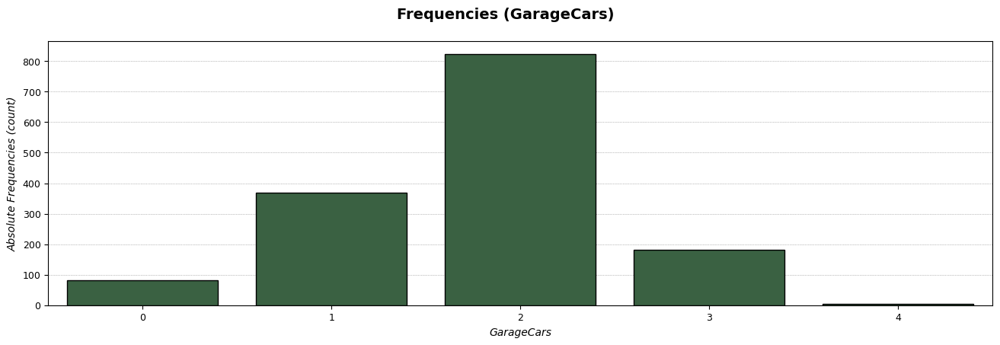

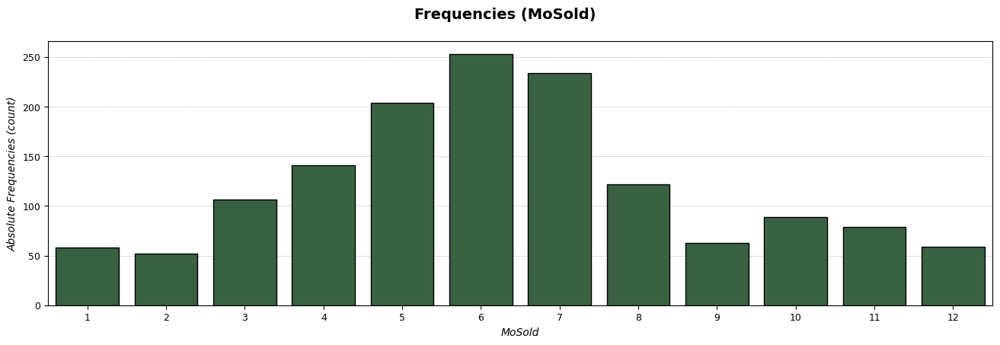

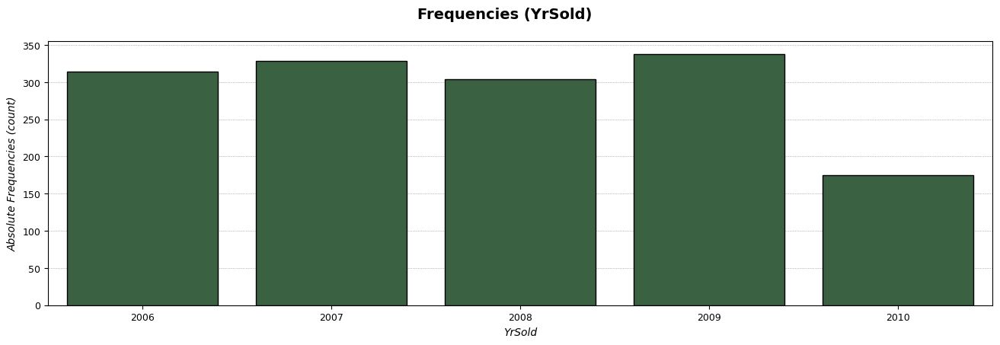

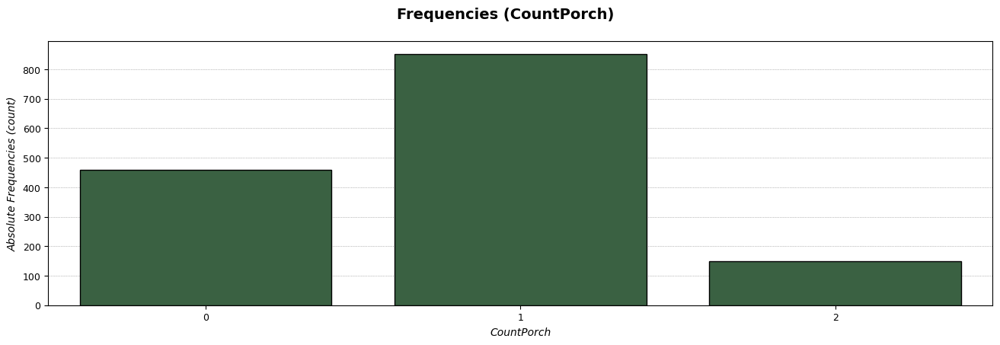

In [225]:
# Dados de Treino
utils.plot_discrete_variables_distributions(quantitative_vars_train_df[list_discrete_vars])

#### Nota:
Após a análise univariada das variáveis quantitativas, podemos perceber:
- **Variável Alvo**:
    1. Mesmo após o tratamento de outliers pelo método Winsorization dos dados de treino, a variável ainda apresenta outliers significativos.
    2. A variável-alvo nos conjuntos de treino e teste apresenta uma simetria próxima, indicando que a distribuição da variável-alvo em ambos os conjuntos é semelhante. Também, o range de valores dos dados de teste está contido no range dos dados de treino. Assim, pode-se concluir que os dados de treino são possivelmente capazes de modelar todos os registros da variável-alvo do teste.
    3. Também é possível constatar que a variável-alvo não possui distribuição normal, pois apresenta valor de significância (p-valor) menor que 0,05 no teste de Kolmogorov-Smirnov, rejeitando a hipótese nula de que a variável se comporta como uma distribuição normal. Assim, serão utilizados testes não-paramétricos no restante da análise exploratória.
    
<hr>

- **Variáveis Contínuas**:
    1. As variáveis que foram ignoradas pela grande quantidade de valores zeradas na etapa de descrição e manipulação, foram as variáveis que menos apresentaram valores únicos. 
    2. Mesmo após o tratamento de outliers pelo método Winsorization dos dados de treino, algumas variáveis ainda apresentam outliers significativos.
    3. Os conjuntos de treino e teste apresentam simetrias moderadamente próxima, porém o range de valores dos dados de teste é um pouco maior que o range dos dados de treino, pelos dados de teste possuirem quantidades significativas de outliers.
    4. Também é possível constatar que nenhuma das variáveis possuem distribuição normal, pois apresentam valores de significância (p-valor) menor que 0,05 no teste de Kolmogorov-Smirnov, rejeitando a hipótese nula de que as variáveis se comportam como uma distribuição normal. Assim, serão utilizados testes não-paramétricos no restante da análise exploratória.
    5. Quase metade das variáveis contínuas apresentam a mediana zerada, por possuirem grandes quantidades de valores zerados, principalmente: **LowQualFinSF**, **3SsnPorch**, **PoolArea** e **MiscVal**, **BsmtFinSF2**, **EnclosedPorch** e **ScreenPorch**, sendo que todos os outros valores diferentes de 0 são outliers (ausência de variabilidade);
        - <u>Hipótese</u>: Definição e agrupamentos de características de imóvel ineficiente - evidenciado pela existência de várias variáveis para declarar a área de diversos tipos de varanda, ou a existência de variável para declarar a área de revestimentos de baixa qualidade - na tentativa de que a variabilidade dos dados seja capturada pelo modelo;
        - <u>Resolução</u>: Criação de novas features através da combinação ou associação entre variáveis (solução já desenvolvida no tópico **"Criação de Features"** acima, para variáveis "Porch") ou a  exclusão das variáveis que não apresentam variabilidade suficiente para modelagem.
    
<hr>

- **Variáveis Discretas**:
    1. Quando comparados os conjuntos de treino e teste, as frequências dos valores das variáveis discretas são quase idênticas. Assim, pode-se concluir que os dados de treino são possivelmente capazes de modelar todos os registros da variável-alvo do teste.
    2. Observei que a variável **GarageYrBuilt** possui 1 registro com o ano de 2207 nos <u>dados de teste</u>, o que é um absurdo. Logo irei substituir o valor desse registro por umas das modas da variável (2007);

In [226]:
test_df['GarageYrBlt'].replace(2207, 2007, inplace=True)

### Variáveis Qualitativas

- **Variáveis qualitativas nominais**: MSSubClass, MSZoning, Street, Alley, LandContour, Utilities, LotConfig, Neighborhood, Condition1, Condition2, BldgType, HouseStyle, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, Foundation, Heating, CentralAir, GarageType, MiscFeature, SaleType,  SaleCondition e HasPorch;
- **Variáveis qualitativas ordinais**: LotShape, LandSlope, OverallQual, OverallCond, ExterQual, ExterCond, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, HeatingQC, Electrical, KitchenQual, Functional, FireplaceQu, GarageFinish, GarageQual, GarageCond, PavedDrive, PoolQC e Fence.

In [227]:
qualitative_vars_train_df = train_df.select_dtypes(include= ['category'])

#### Variáveis Nominais

In [228]:
list_nominal_vars = ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LandContour', 'Utilities', 
                     'LotConfig', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 
                     'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
                     'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'GarageType', 
                     'MiscFeature', 'SaleType', 'SaleCondition', 'HasPorch']

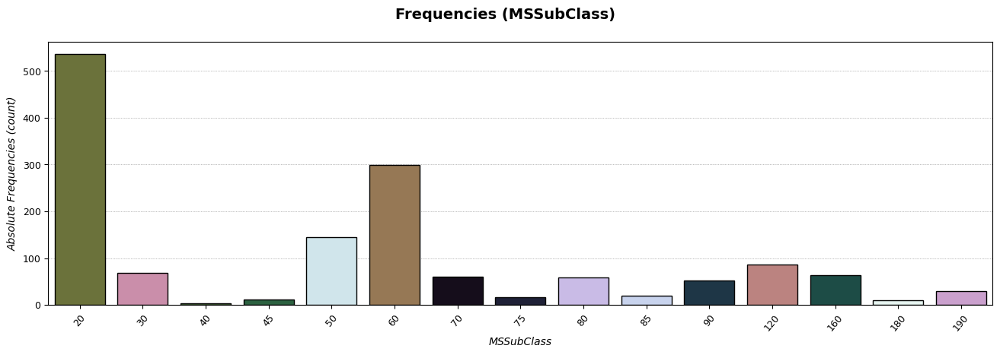

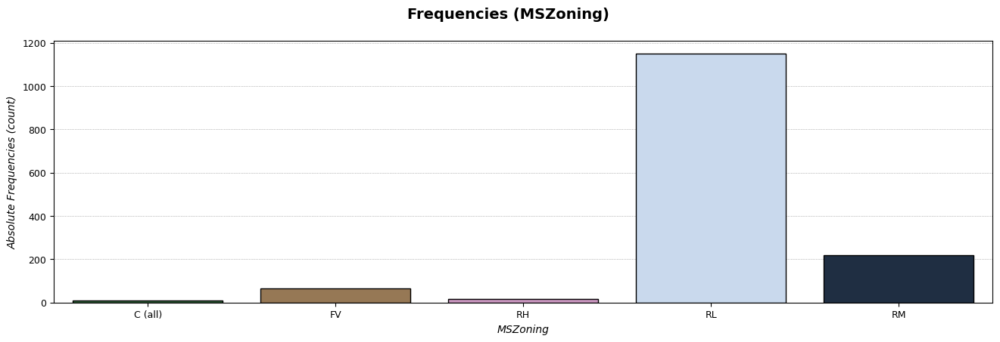

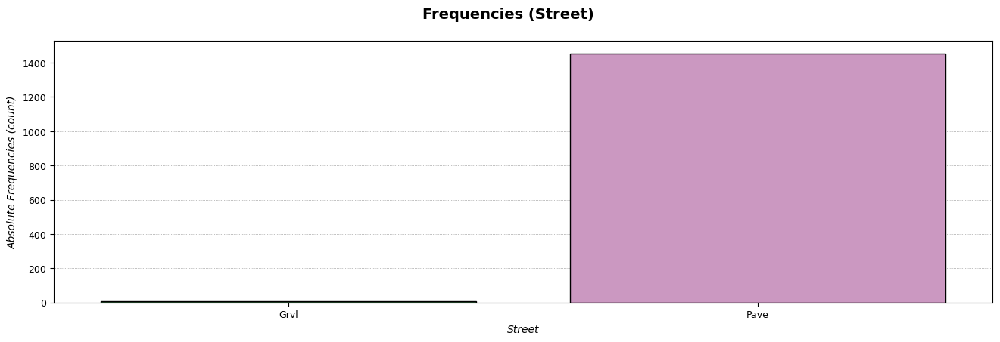

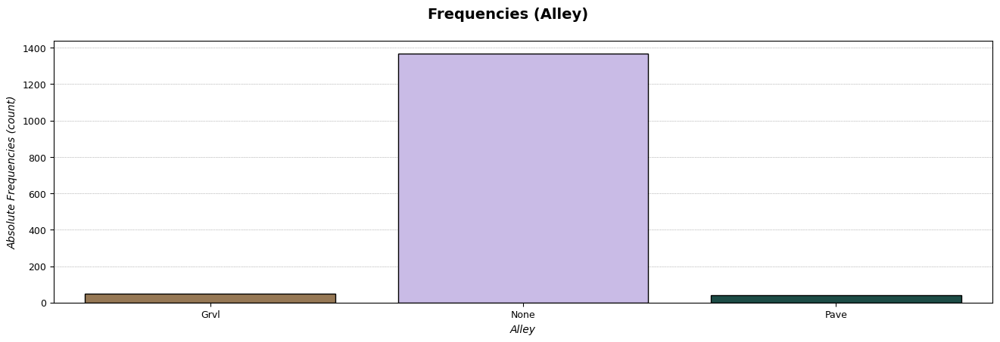

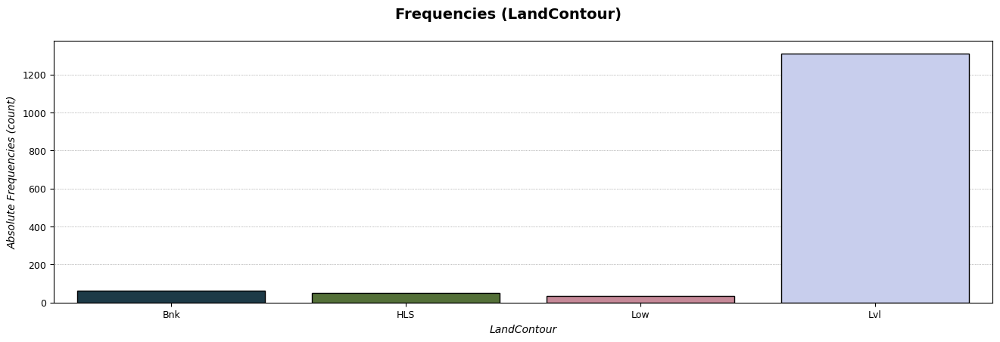

...

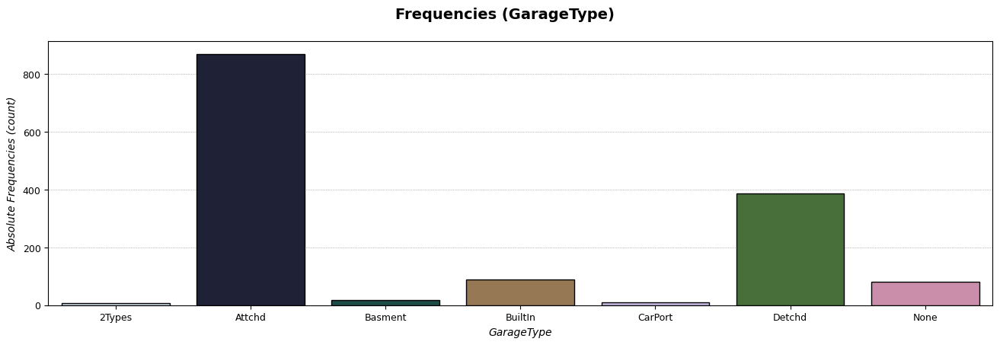

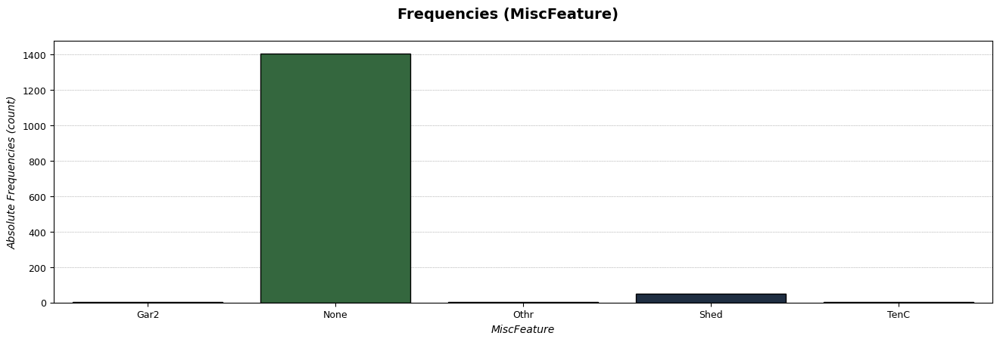

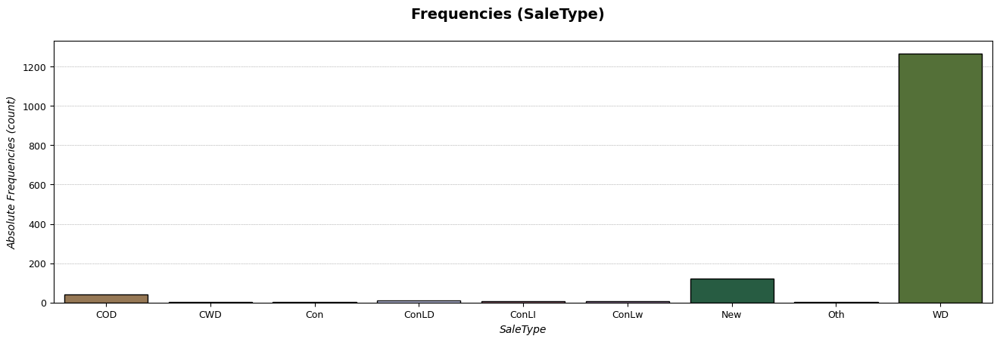

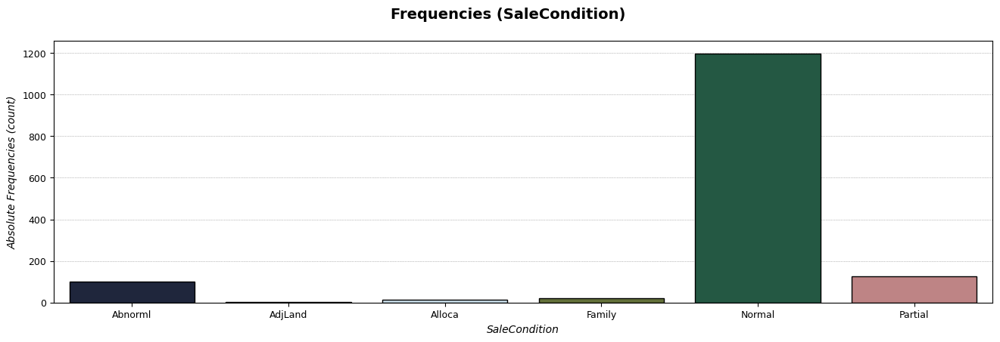

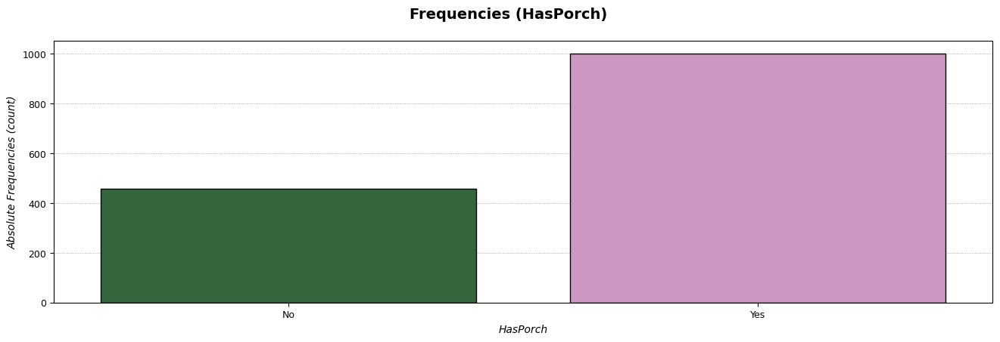

In [229]:
# Dados de Treino
utils.plot_nominal_variables_distributions(qualitative_vars_train_df[list_nominal_vars])

#### Variáveis Ordinais

In [230]:
dict_ordinal_vars = {'LotShape':['IR3', 'IR2', 'IR1', 'Reg'], 
                     'LandSlope':['Gtl', 'Mod', 'Sev'],
                     'OverallQual': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                     'OverallCond': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10], 
                     'ExterQual':['Po', 'Fa', 'TA', 'Gd', 'Ex'], 
                     'ExterCond':['Po', 'Fa', 'TA', 'Gd', 'Ex'], 
                     'BsmtQual':['None','Po', 'Fa', 'TA', 'Gd', 'Ex'],
                     'BsmtCond':['None','Po', 'Fa', 'TA', 'Gd', 'Ex'], 
                     'BsmtExposure': ['None','No', 'Mn', 'Av', 'Gd'],
                     'BsmtFinType1':['None', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'], 
                     'BsmtFinType2':['None', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],
                     'HeatingQC':['Po', 'Fa', 'TA', 'Gd', 'Ex'], 
                     'Electrical': ['Mix', 'FuseP', 'FuseF', 'FuseA', 'SBrkr'],
                     'KitchenQual':['Po', 'Fa', 'TA', 'Gd', 'Ex'],
                     'Functional':['Sal', 'Sev', 'Maj2', 'Maj1', 'Mod', 'Min2', 'Min1', 'Typ'],
                     'FireplaceQu':['None','Po', 'Fa', 'TA', 'Gd', 'Ex'], 
                     'GarageFinish':['None', 'Unf', 'RFn', 'Fin'],
                     'GarageQual':['None','Po', 'Fa', 'TA', 'Gd', 'Ex'], 
                     'GarageCond':['None','Po', 'Fa', 'TA', 'Gd', 'Ex'],
                     'PavedDrive': ['N', 'P', 'Y'],
                     'PoolQC': ['None', 'Fa', 'TA', 'Gd', 'Ex'],
                     'Fence': ['None', 'MnWw', 'GdWo', 'MnPrv', 'GdPrv']}

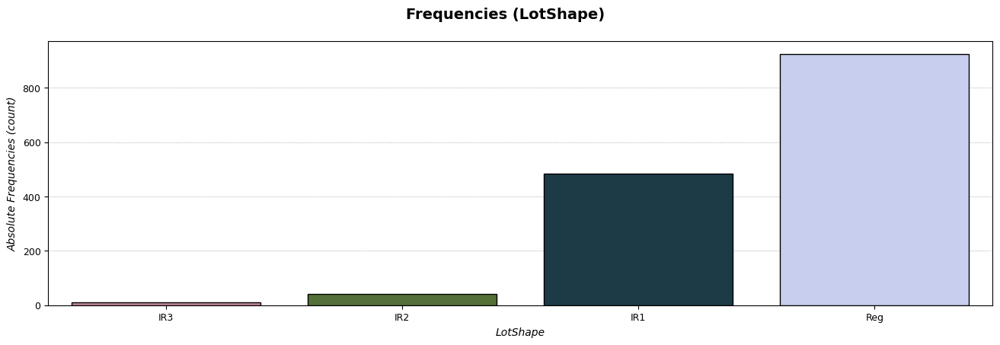

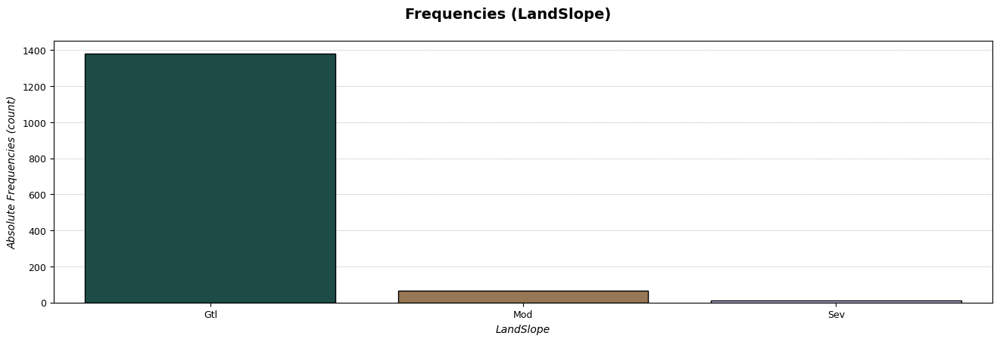

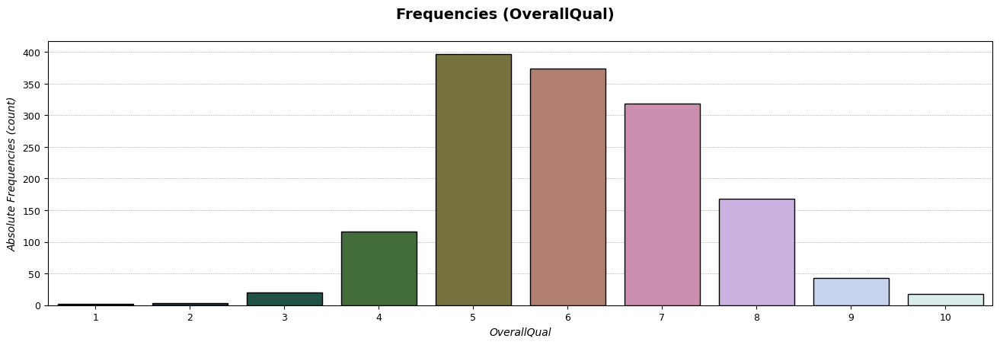

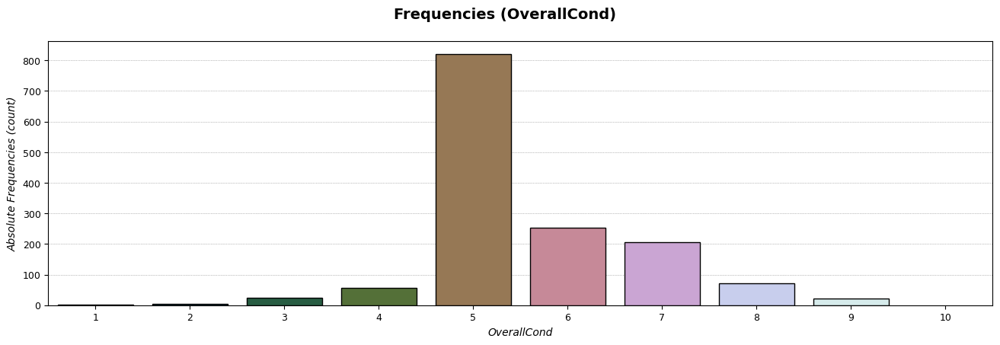

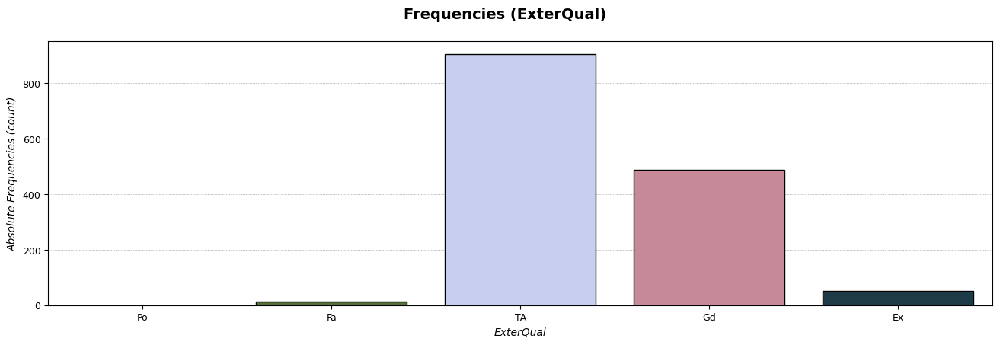

...

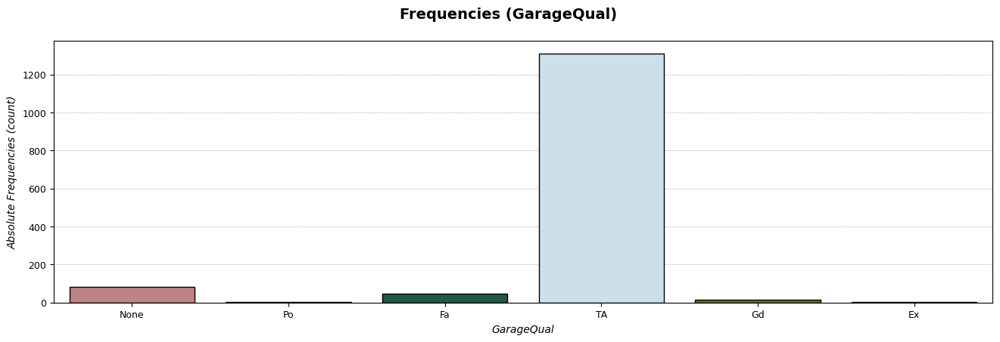

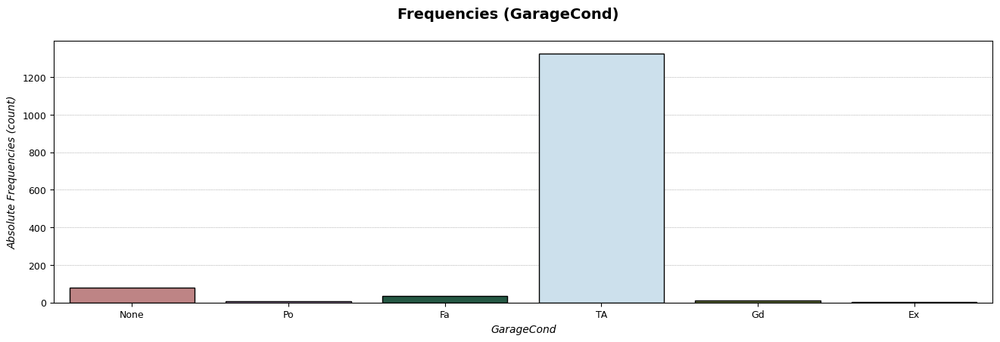

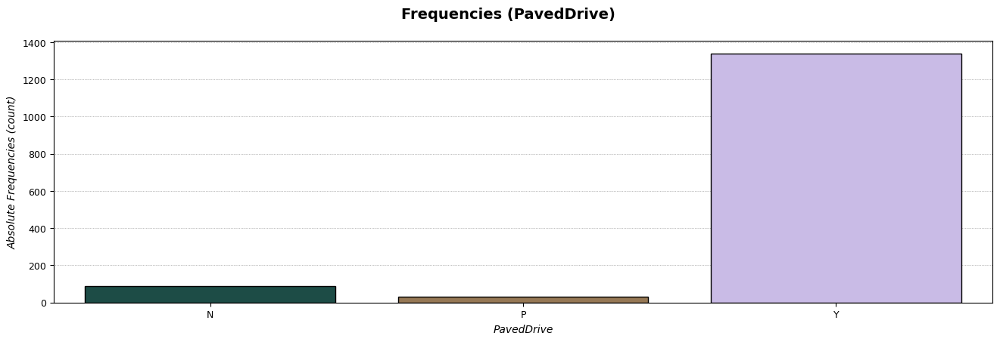

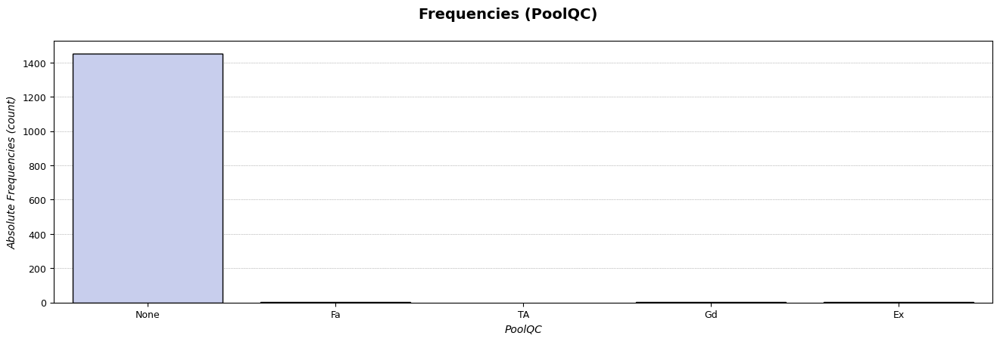

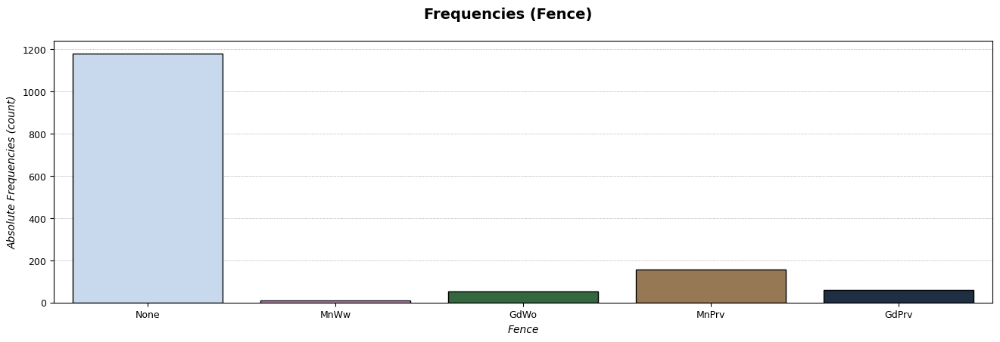

In [231]:
# Dados de Treino
utils.plot_ordinal_variables_distributions(qualitative_vars_train_df, dict_ordinal_vars)

#### Nota:

Após a análise univariada das variáveis qualitativas, podemos perceber:
- **Variáveis Nominais e Ordinais**:
    1. Quando comparados os conjuntos de treino e teste, as frequências dos valores das variáveis nominais e ordinais são quase idênticas. Assim, pode-se concluir que os dados de treino são possivelmente capazes de modelar todos os registros da variável-alvo do teste;
    2. As variáveis categóricas: **Street**, **Utilities**, **Condition2**, **RoofMatl**, **Heating**, **MiscFeature** e **PoolQC** apresentam mais de 95% dos dados concentrados em apenas 1 grupo em ambos os conjuntos de dados. Já a variável **Utilities** possui todos os seus dados de teste concentrados em apenas 1 grupo, não apresentando variabilidade.

## Análise Bivariada (Variáveis Independentes x Variável Alvo)

### Variáveis Quantitativa x Variável Alvo

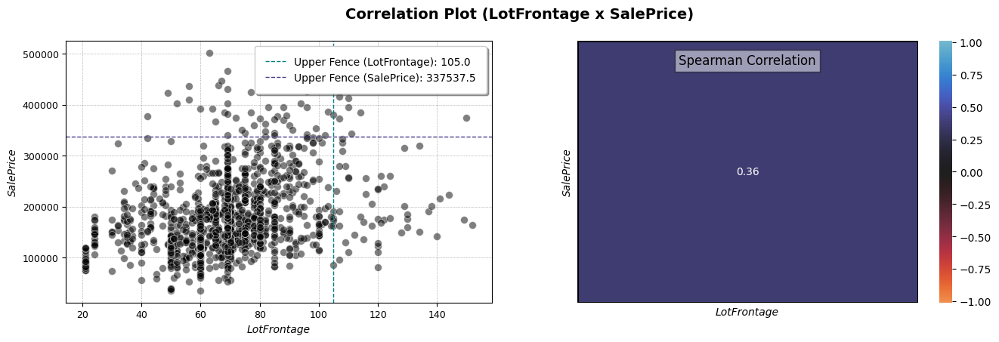

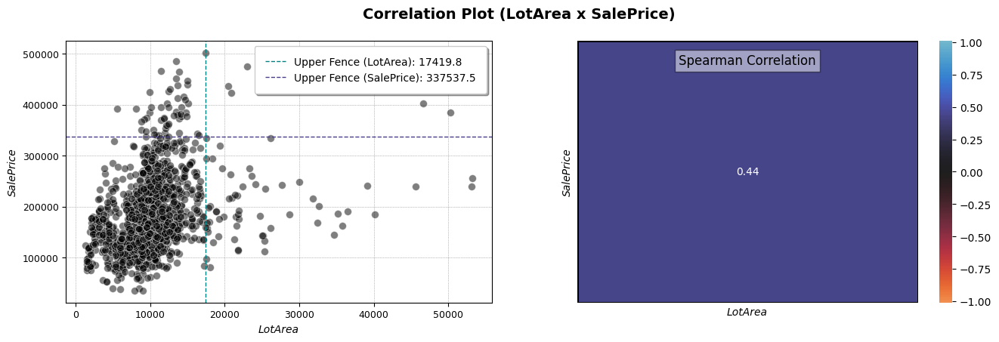

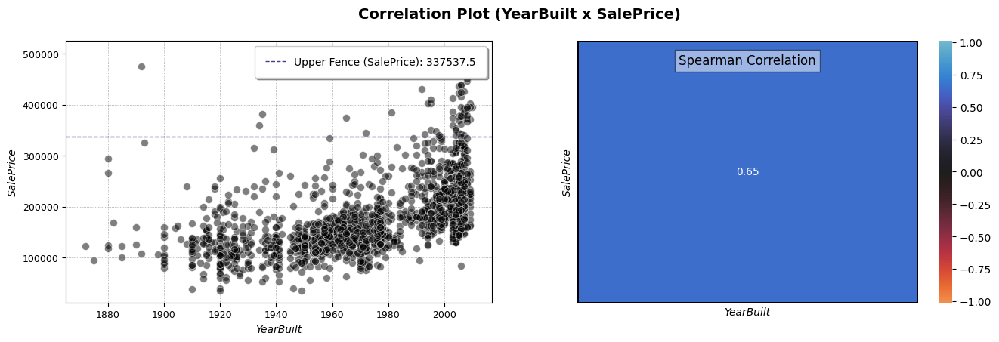

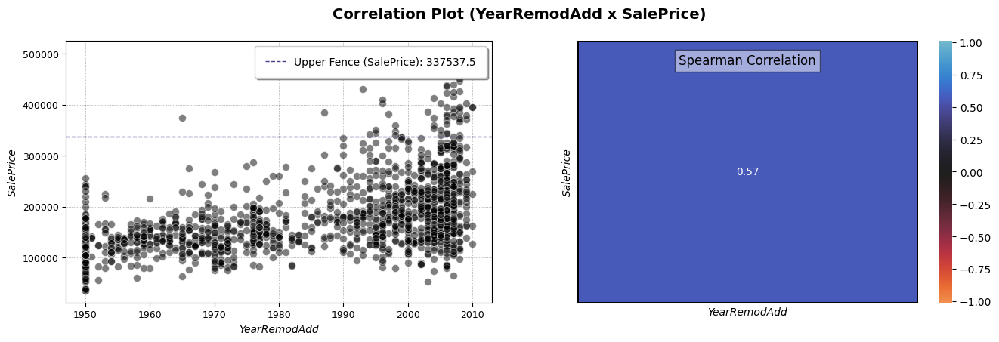

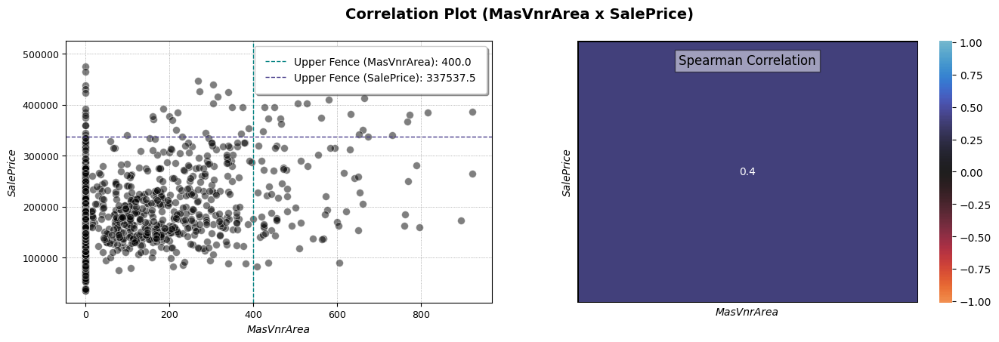

...

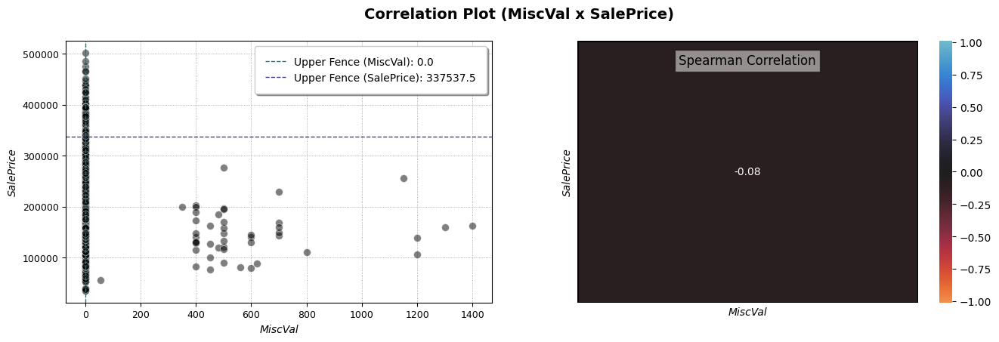

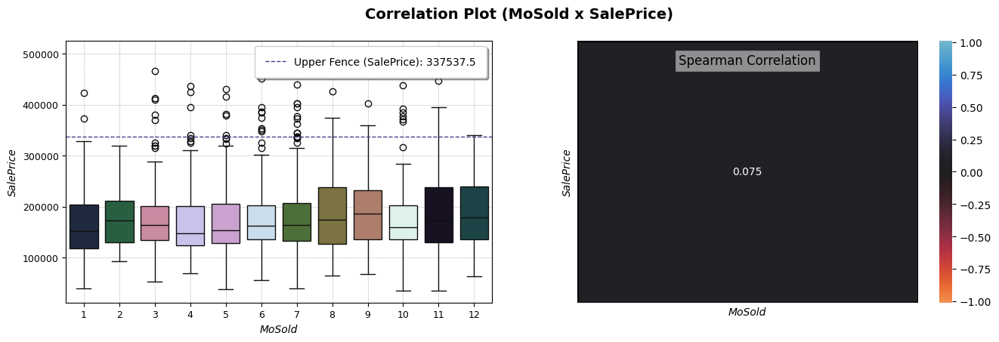

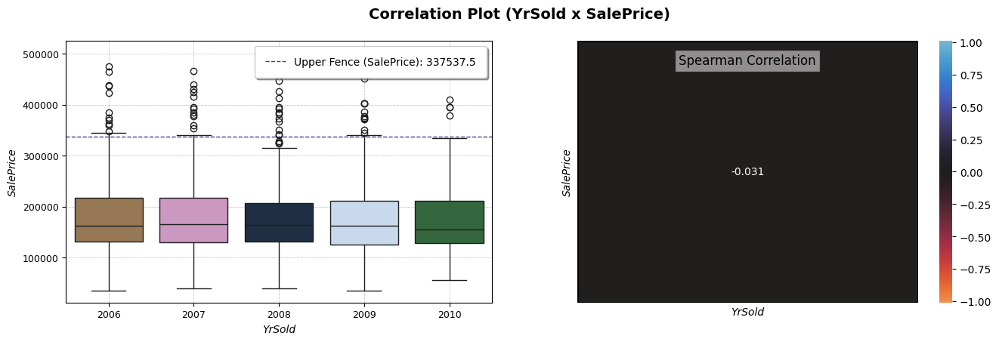

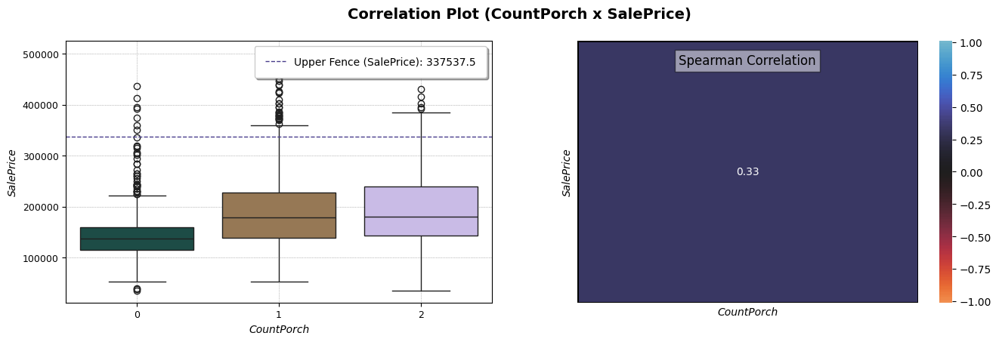

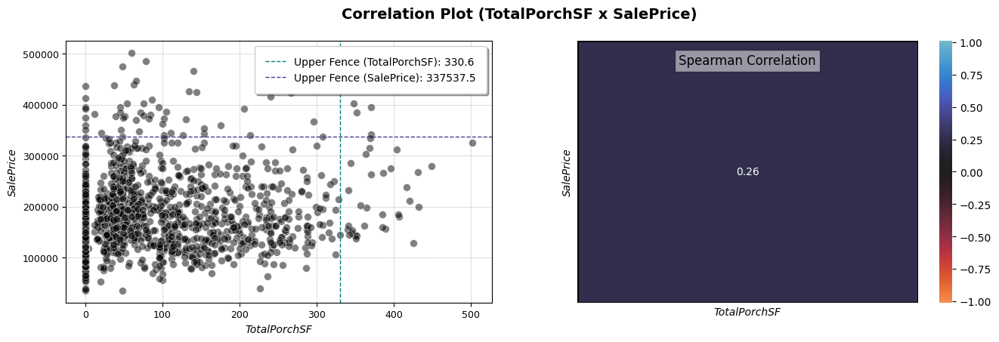

In [232]:
utils.plot_bivariate_analysis_quantitative_variables(quantitative_vars_train_df, target_var_train_df, list_discrete_var_names= list_discrete_vars)

#### Nota:
Nenhuma das variáveis quantitativas dos dados de treino possuem correlações muito fortes ou fortes com a variável alvo. Das que possuem correlações significativas são:

- Moderadas e Fracas: **LotFrontage**, **LotArea**, **YearBuilt**, **YearRemodAdd**, **MasVnrArea**, **BsmtFinSF1**, **TotalBsmtSF**, **1stFlrSF**, **2ndFlrSF**, **GrLivArea**, **BsmtFullBath**, **FullBath**, **HalfBath**, **BedroomAbvGr**, **TotRmsAbvGrd**, **Fireplaces**, **GarageYrBlt**, **GarageCars**, **GarageArea**, **WoodDeckSF**, **OpenPorchSF**,  **EnclosedPorch**, **CountPorch** e **TotalPorchSF**;

As variáveis que não possuem correlações significativas são:

- Muito fraca: **BsmtFinSF2**, **BsmtUnfSF**, **LowQualFinSF**, **BsmtHalfBath**, **KitchenAbvGr**, **3SsnPorch**, **ScreenPorch**, **PoolArea**, **MiscVal**, **MoSold** e **YrSold**;

<u>Correlações</u>: 
- 0.9 a 1: Muito Forte; 
- 0.7 a 0.89: Forte; 
- 0.4 a 0.69: Moderada; 
- 0.2 a 0.39: Fraca; 
- 0.0 a 0.19: Muito fraca.

<u>Obs.</u>: Além de possuirem ausência de variabilidade pela grande presença de valores zerados, as variáveis **LowQualFinSF**, **3SsnPorch**, **PoolArea** e **MiscVal**, **BsmtFinSF2** e **ScreenPorch** possuem correlação mínima com a variável alvo.

### Variáveis Qualitativa x Variável Alvo

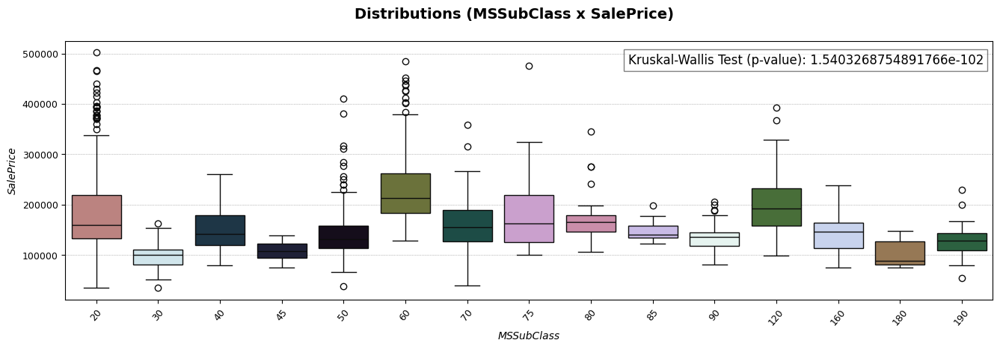

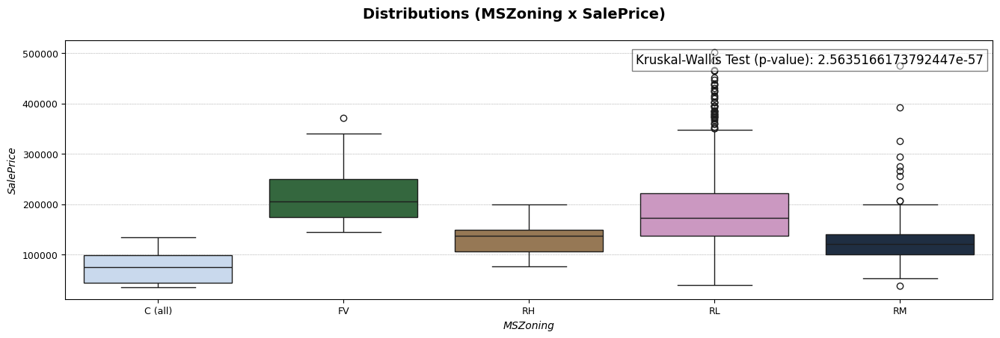

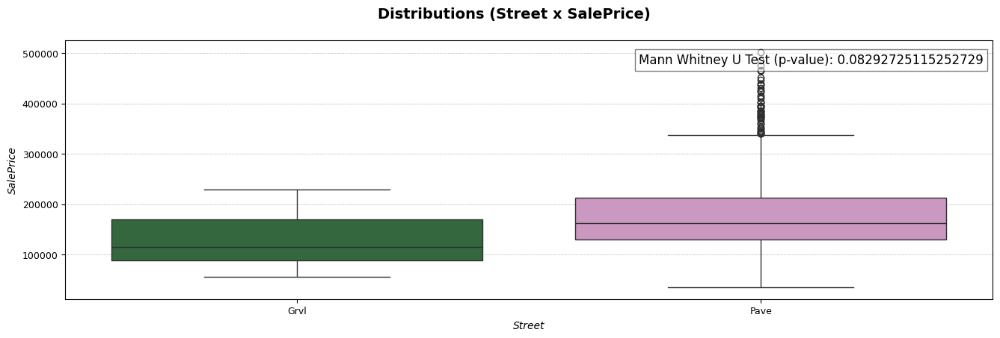

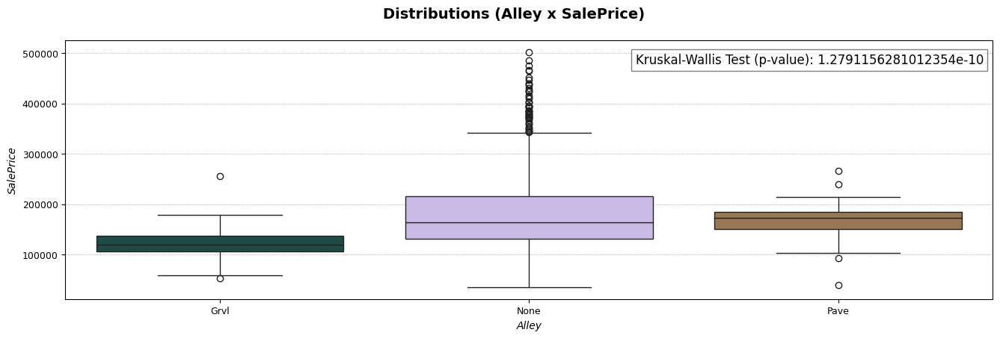

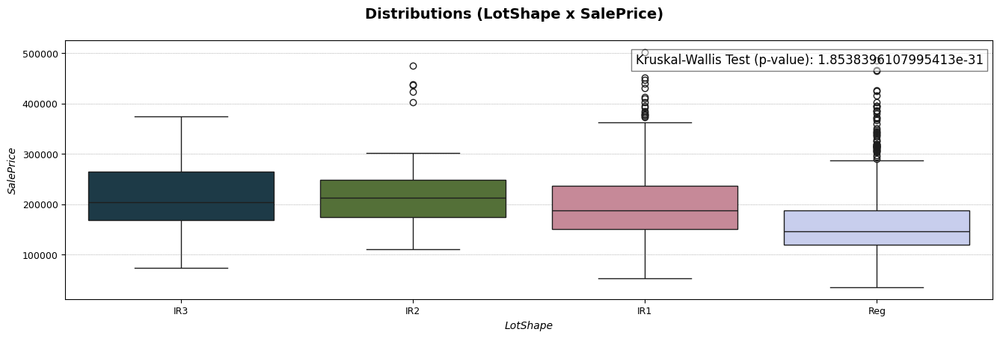

...

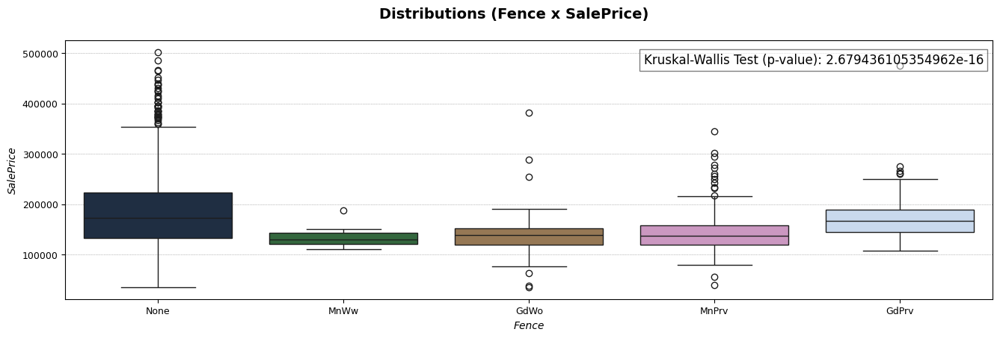

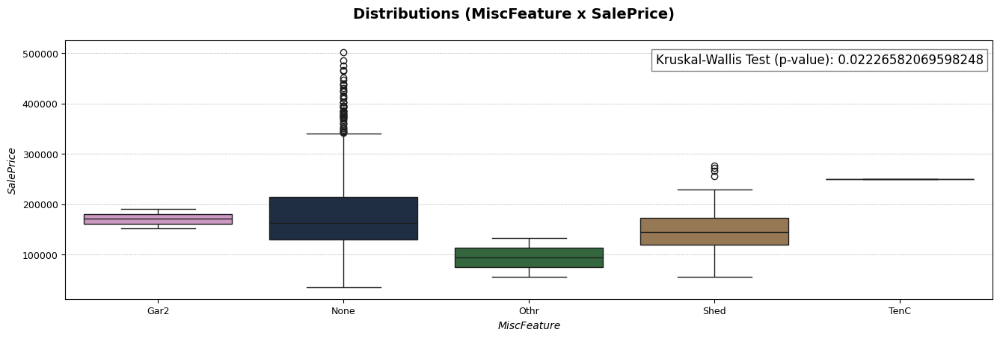

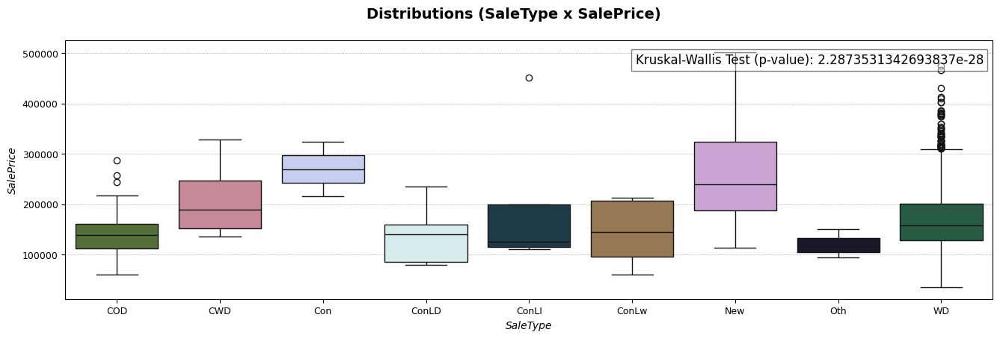

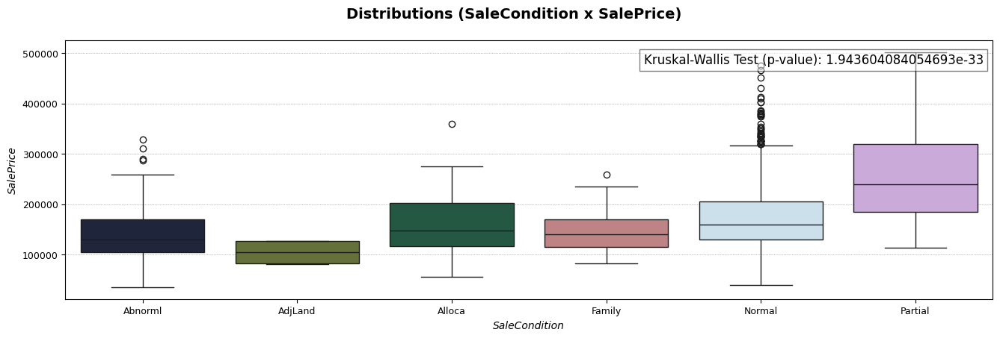

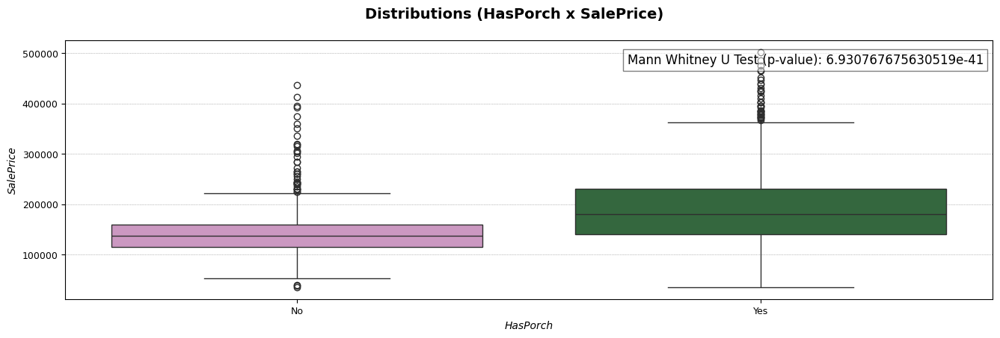

In [233]:
utils.plot_bivariate_analysis_continuous_target_and_qualitative_independent_vars(target_var_train_df, qualitative_vars_train_df, dict_ordinal_vars)

#### Nota:
Além das variáveis categóricas **Utilities** e **PoolQC** (já identificadas em etapas acima), é possível constatar que apenas as variáveis **Street**, **LandSlope**, **RoofMatl** e **MiscFeature**, também não possuem diferenças significativas entre os seus grupos quando associadas a variável alvo, pois apresentam valores de significância (p-valor) maior ou próximos de 0,01 no teste de Kruskal-Wallis, validando a hipótese nula de que os grupos não apresentam diferença significativa entre si.

## Análise Multivariada

### Variáveis Quantitativas (Correlação de Spearman)

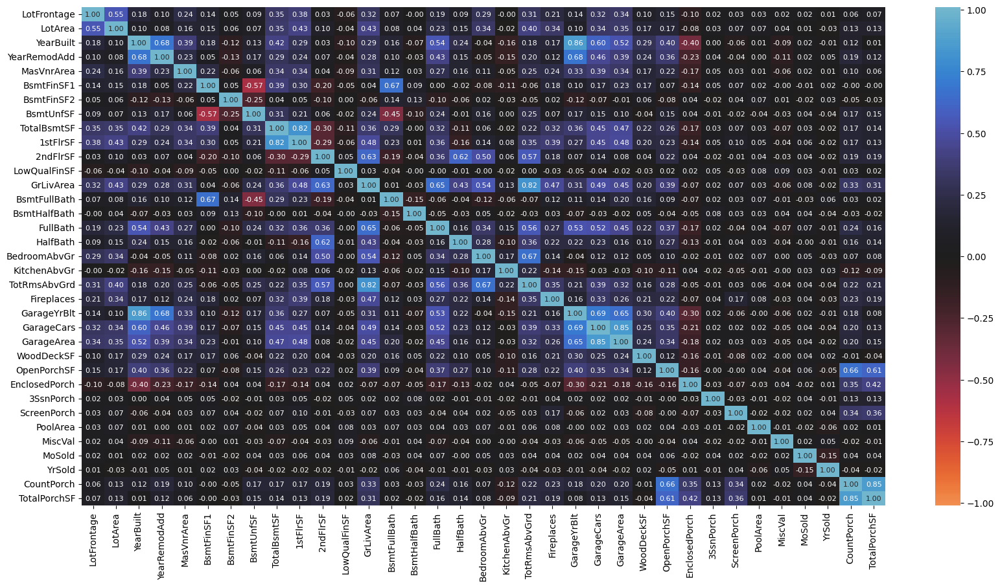

In [234]:
utils.plot_multivariate_heatmap_quantitative_vars(quantitative_vars_train_df)

### Variáveis Quantitativas x Qualitativas (T-Test, ANOVA, Mann-Whitney U, ou Kruskal-Wallis Testes)

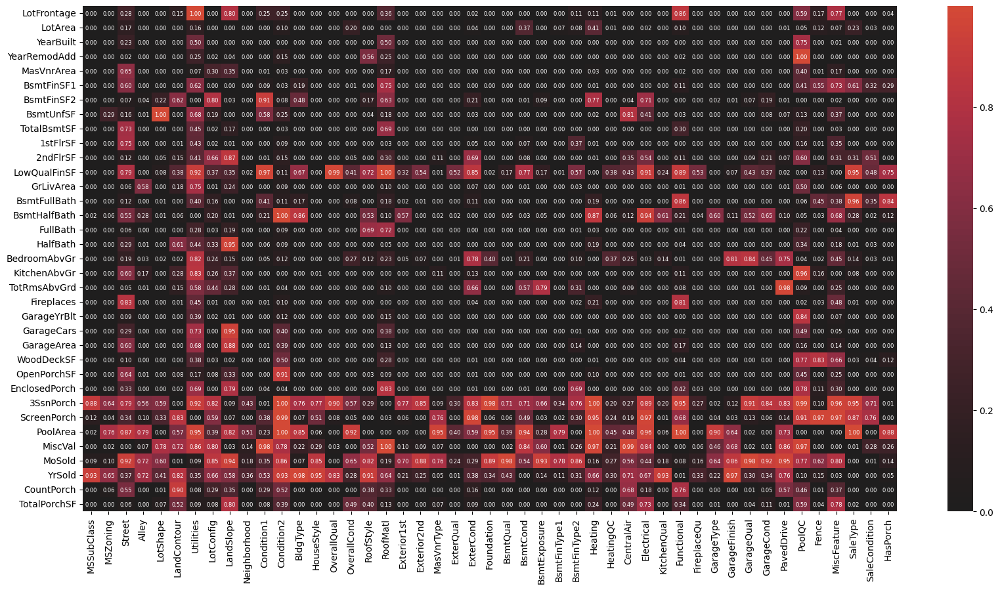

In [235]:
utils.plot_multivariate_heatmap_quantitative_qualitative_vars(quantitative_vars_train_df, qualitative_vars_train_df)

### Variáveis Qualitativas (Chi-Square, Mann-Withney U e Kruskal-Wallis Testes)

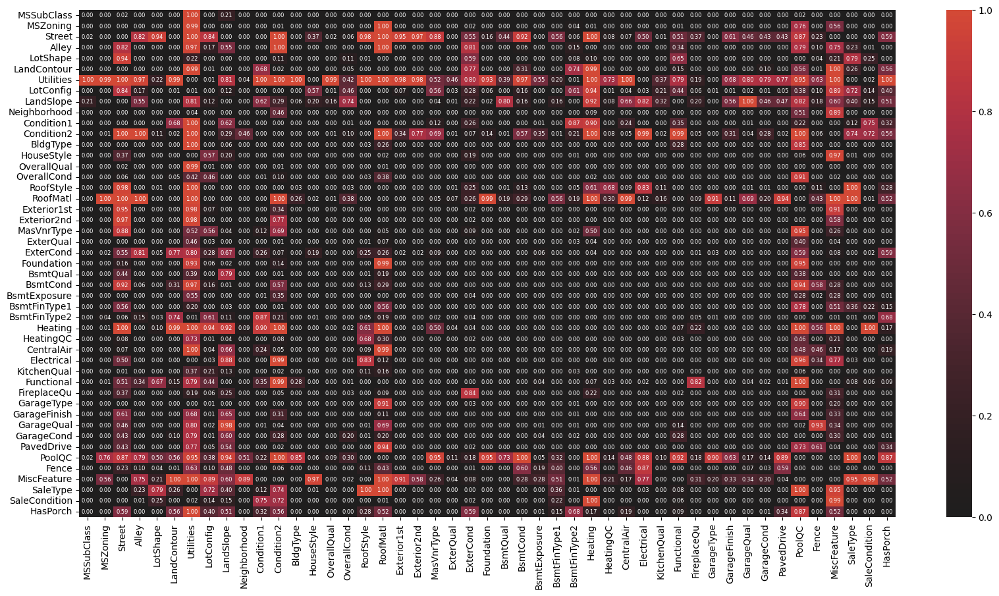

In [236]:
utils.plot_multivariate_heatmap_qualitative_vars(qualitative_vars_train_df, ordinal_vars_dict= dict_ordinal_vars)

## Nota:
Após identificar as variáveis quantitativas que possuem correlações muito fracas com a variável alvo, e as variáveis qualitativas que não possuem diferenças significativas entre seus grupos quando associadas à variável alvo, analisei a associação das mesmas variáveis com outras variáveis independentes, com o intuito de achar associações que possam ser capturadas por tipos de modelos mais robustos, como modelos ensembles.

- Das variáveis quantitativas que não possuem correlação significativa com a variável alvo (**BsmtFinSF2**, **BsmtUnfSF**, **LowQualFinSF**, **BsmtHalfBath**, **KitchenAbvGr**, **3SsnPorch**, **ScreenPorch**, **PoolArea**, **MiscVal**, **MoSold** e **YrSold**): 
    - **BsmtUnfSF** apresenta correlação significativas com 7 variáveis quantitativas indpendentes;
    - **BsmtFinSF2** e **KitchenAbvGr** apresentam correlação fraca com apenas 1 outra variável quantitativa independente em ambos os conjuntos de dados;
    - **ScreenPorch** só apresenta correlação significativa com 2 variáveis que foram criadas a partir dela na etapa de **Criação de Variáveis**. Residências com esse tipo de varanda também apresentam uma pequena correlação com a existência de lareiras.
    - **LowQualFinSF**, **BsmtHalfBath**, **3SsnPorch**, **MiscVal**, **MoSold** e **YrSold** não apresentaram correlações significativas com nenhuma outra variável quantitativaa independente.

- Das <u>variáveis quantitativas</u> que não apresentaram correlações significativas com outras variáveis quantitativas independentes (**LowQualFinSF**, **BsmtHalfBath**, **3SsnPorch**, **PoolArea**, **MiscVal**, **MoSold** e **YrSold**), as que mais se destacaram por apresentarem muitos p-valores > 0.1 nos testes de Mann-Whitney U e Kruskal-Wallis (aceitando a hipótese nula de que não há diferença entre os grupos) <u>quando associadas com variáveis qualitativas</u>, foram: **3SsnPorch**, **PoolArea**, **MoSold** e **YrSold**;

- As <u>variáveis qualitativas</u> que mais se destacaram por apresentarem muitos p-valores > 0.1 nos testes de Mann-Whitney U e Kruskal-Wallis (aceitando a hipótese nula de que não há diferença entre os grupos) <u>quando associadas com variáveis quantitativas e qualitativas</u> , foram: **Street**, **Utilities**, **Condition2**,  **RoofMatl**, **Heating**, **PoolQC** e **MiscFeature**;

<u>Obs.</u>: 
1. Tanto as correlações de Spearman (variáveis quantitativas), quanto os p-valores dos teste de Mann-Withney e Kruskal-Willis (variáveis quantitativas x qualitativas) apresentaram bastante similaridade entre os dados de treino e de teste, desconsiderando a variável alvo.

# Seleção de Features

- As variáveis: **PoolQC**, **LowQualFinSF**, **3SsnPorch**, **PoolArea** e **MiscVal** possuem mais 95% de valores faltantes ou zerados, tanto nos dados de treino e dados de teste. Com isso, por não apresentaram variabilidade significativa, as variávies serão desconsideradas após a seleção de features;

- Quase metade das variáveis contínuas apresentam a mediana zerada, por possuirem grandes quantidades de valores zerados, principalmente: **LowQualFinSF**, **3SsnPorch**, **PoolArea** e **MiscVal**, **BsmtFinSF2**, **EnclosedPorch** e **ScreenPorch** sendo que todos os outros valores diferentes de 0 são outliers (ausência de variabilidade);

- As variáveis categóricas: **Street**, **Utilities**, **Condition2**, **RoofMatl**, **Heating**, **MiscFeature** e **PoolQC** apresentam mais de 95% dos dados concentrados em apenas 1 grupo em ambos os conjuntos de dados;

- Além de possuirem ausência de variabilidade pela grande presença de valores zerados, as variáveis **LowQualFinSF**, **3SsnPorch**, **PoolArea** e **MiscVal**, **BsmtFinSF2** e **ScreenPorch** possuem correlação mínima com a variável alvo. Outras variáveis que apresentaram correlação muito fraca com a vairável alvo, foram: **BsmtUnfSF**, **BsmtHalfBath**, **KitchenAbvGr**, **MoSold** e **YrSold**;

- **LowQualFinSF**, **BsmtHalfBath**, **3SsnPorch**, **MiscVal**, **MoSold** e **YrSold** não apresentaram correlações significativas com nenhuma outra variável quantitativa independente;

- As <u>variáveis quantitativas</u> que mais se destacaram por apresentarem muitos p-valores > 0.1 nos testes de Mann-Whitney U e Kruskal-Wallis (aceitando a hipótese nula de que não há diferença entre os grupos) <u>quando associadas com variáveis qualitativas</u> , foram: **3SsnPorch**, **PoolArea**, **MoSold** e **YrSold**;

- As <u>variáveis qualitativas</u> que mais se destacaram por apresentarem muitos p-valores > 0.1 nos testes de Mann-Whitney U e Kruskal-Wallis (aceitando a hipótese nula de que não há diferença entre os grupos) <u>quando associadas com variáveis quantitativas e qualitativas</u> , foram: **Street**, **Utilities**, **Condition2**,  **RoofMatl**, **Heating**, **PoolQC** e **MiscFeature**;

Através destes pontos, irei desconsiderar as seguintes variáveis:

In [237]:
unselected_vars_list = ['PoolQC', 'LowQualFinSF', '3SsnPorch', 'PoolArea', 'MiscVal', 'BsmtFinSF2', 
                        'BsmtHalfBath', 'MoSold', 'YrSold', 'Street', 'Utilities', 'Condition2',
                        'RoofMatl', 'Heating', 'MiscFeature', 'PoolQC']

Irei observar se as variáveis desconsideradas irão possuir baixo valores de score pelo algoritmo SelectKBest usando o método Informação Mútua para comparar os níveis de dependência das variáveis de entrada com a variável alvo.

In [238]:
# Definido o conjunto de dados para verificar a importância das features para modelagem do fenômeno
X_feature_selection_df =  pd.concat([quantitative_vars_train_df, qualitative_vars_train_df], axis= 1)
y_feature_selection_df = target_var_train_df.copy()

In [239]:
# Transformando as variáveis categóricas em números de 1 a n
for col_name in X_feature_selection_df.select_dtypes("category"):
    X_feature_selection_df[col_name], unique_categories = X_feature_selection_df[col_name].factorize()

In [240]:
# Máscara para identificação de variáveis discretas no conjunto 'X_feature_selection_df'
discrete_mask = [False if var_name in list_continuous_vars else True for var_name in X_feature_selection_df.columns.to_list()]

In [241]:
# Definindo e treinando o algoritmo de seleção de features
selector = SelectKBest(score_func= lambda X, y: mutual_info_regression(X, y, random_state= 33, discrete_features= discrete_mask), k= 'all')
selected_features_df = selector.fit_transform(X_feature_selection_df, y_feature_selection_df)

# Extraindo os scores e nome das variáveis
names_selected_features = selector.get_feature_names_out()
scores = selector.scores_

# Criando conjunto de dados com os scores das variáveis
data = {'variables': X_feature_selection_df.columns.values, 'scores': scores}
score_selected_features_df = pd.DataFrame(data)
score_selected_features_df = score_selected_features_df.loc[score_selected_features_df['variables'].isin(names_selected_features)]
score_selected_features_df.sort_values('scores', ascending= False, inplace= True)

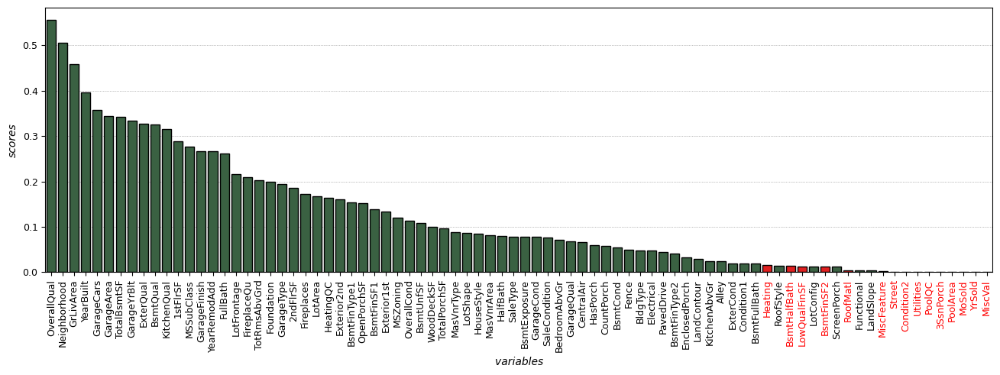

In [242]:
# Função para definir a cor das barras do gráfico de acordo com as variáveis rejeitadas na AED
def get_color(var):
    return 'red' if var in unselected_vars_list else '#34673e'

# Criando do gráfico de barras para scores do algoritmo de seleção de features
fig, ax = plt.subplots(1, 1, figsize=(16, 4.5))

sns.barplot(data= score_selected_features_df, x='variables', y='scores',
            palette=[get_color(var) for var in score_selected_features_df['variables'].unique()],
            edgecolor='black', ax= ax)
## Adiciona e customiza grades na horizontal
ax.grid(color= "gray", linestyle= "dotted", linewidth= 0.5, axis= 'y')
ax.set_axisbelow(True)
## Personalizando as cores e a rotação dos rótulos no eixo x
for label in ax.get_xticklabels():
    label.set_color('red' if label.get_text() in unselected_vars_list else 'black')
## Customiza labels e intervalos nos eixos horizontais dos gráficos
ax.xaxis.label.set_size(10)
ax.xaxis.label.set_fontstyle('italic')
ax.tick_params(axis='x', labelsize= 9, labelrotation= 90)
## Customiza labels e intervalos nos eixos verticiais dos gráficos
ax.yaxis.label.set_size(10)
ax.yaxis.label.set_fontstyle('italic')
ax.tick_params(axis='y', labelsize= 9, labelrotation= 0)

plt.show()

Em vermelho, estão sinalizadas as variáveis que foram desconsideradas para o treinamento do modelo na análise exploratória dos dados. No ranqueamento das features pelo método de informação mútua, podemos observar que as variáveis desconsideradas possuem valor de score próximo de 0, o que significa que as variáveis não apresentam nenhum grau de dependência com a variável alvo.
Dessa forma, é possível validar a análise exploratória dos dados e dar prosseguimento para o treinamento do modelo.

In [243]:
# Excluindo features irrelevantes nas listas de tipos de variáveis
list_continuous_vars = [var_name for var_name in list_continuous_vars if var_name not in unselected_vars_list]
list_discrete_vars = [var_name for var_name in list_discrete_vars if var_name not in unselected_vars_list]
list_nominal_vars = [var_name for var_name in list_nominal_vars if var_name not in unselected_vars_list]
dict_ordinal_vars = {chave: valor for chave, valor in dict_ordinal_vars.items() if chave not in unselected_vars_list}

# Modelagem Preditiva

## Definição dos Conjuntos de Dados de Treino e Teste

In [244]:
X_train = train_df.drop(columns= ['Id', 'SalePrice'] + unselected_vars_list)
X_test = test_df.drop(columns= ['Id'] + unselected_vars_list)

y_train = target_var_train_df['SalePrice'].values

## Preparação do Pré-processador de Dados

In [245]:
# Listando as features por tipo de transformações
list_min_max_scaling_vars = ['BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', 
                             '2ndFlrSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF']

list_robust_scaling_vars = [var for var in list_continuous_vars if var not in list_min_max_scaling_vars]

list_one_hot_encoding_vars = list_nominal_vars.copy()

for key in ['OverallQual', 'OverallCond']:
    dict_ordinal_vars.pop(key, None)
list_ordinal_encoding_vars = list(dict_ordinal_vars.keys())

list_binary_encoding_vars = ['CentralAir', 'HasPorch']

list_passthrough_vars = list_discrete_vars + list_binary_encoding_vars

In [246]:
def custom_binary_transformation(X_dataframe):
    for var in list_binary_encoding_vars:
        X_dataframe[var] = X_dataframe[var].apply(lambda x: 0 if (x == 'N') or (x == 'No') else 1)
        X_dataframe[var] = X_dataframe[var].cat.codes.astype('int64')
    return X_dataframe

X_train = custom_binary_transformation(X_train)
X_test = custom_binary_transformation(X_test)

In [247]:
preprocessors_lists = {'list_min_max_scaling_vars': list_min_max_scaling_vars, 
                       'list_robust_scaling_vars': list_robust_scaling_vars,
                       'list_one_hot_encoding_vars': list_one_hot_encoding_vars,
                       'list_ordinal_encoding_vars': list_ordinal_encoding_vars,
                       'list_passthrough_vars': list_passthrough_vars}

In [248]:
# Instaciando e criando transformadores para os dados
min_max_transformer = MinMaxScaler()

robust_transformer = RobustScaler()

one_hot_transformer = OneHotEncoder(feature_name_combiner='concat', handle_unknown= 'ignore')

matrix_ordinal_categories = [dict_ordinal_vars[col] for col in list_ordinal_encoding_vars] 
ordinal_transformer = OrdinalEncoder(categories= matrix_ordinal_categories)

In [249]:
# Criando pré processador de dados para o treinamento dos modelos
preprocessor = ColumnTransformer(
                   transformers= [
                       ('MinMaxScalingTransformation', min_max_transformer, list_min_max_scaling_vars),
                       ('RobustScalingTransformation', robust_transformer, list_robust_scaling_vars),
                       ('OneHotEncodingTransformation', one_hot_transformer, list_one_hot_encoding_vars),
                       ('OrdinalEncodingTransformation', ordinal_transformer, list_ordinal_encoding_vars),
                       ('PassthroughVars', 'passthrough', list_passthrough_vars)])

## Validação Cruzada com Otimização de Hiperparâmetros

In [250]:
# Definindo métricas para avaliação do modelo
scoring = {
    'MAE': 'neg_mean_absolute_error',
    'RMSE': 'neg_root_mean_squared_error',
    'RMSLE': 'neg_root_mean_squared_log_error'
}

In [251]:
# Definindo a quantidade de conjuntos para validação cruzada
kf = KFold(n_splits= 12, random_state= 33, shuffle= True)

### Regressão Linear

In [252]:
# Criando pipeline para processamento e treinamento do modelo de Regressão Linear
lr_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                              ('lr', LinearRegression(n_jobs= 8))])

In [253]:
# Treinando e avaliando o modelo de Regressão Linear
linear_reg_scores = cross_validate(lr_pipeline, X_train, y_train, cv= kf, scoring= scoring)
print_model_performance_linear_reg(linear_reg_scores)

Pontuação de validação (RMSE): -33539.537 ± 5250.945
Pontuação de validação (RMSLE): nan ± nan


### Floresta Aleatória

In [254]:
# Criando pipeline para processamento e treinamento do modelo de Floresta Aleatória
rf_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                              ('rf', RandomForestRegressor(random_state= 33))])

In [255]:
# Definindo range dos hiperparâmetros a serem testados pelo método de pesquisa de hiperparâmetros BayesSearch
rf_params_space = {'rf__n_estimators': Integer(100, 501),
                   'rf__max_depth': Integer(10, 101),
                   'rf__min_samples_split': Integer(2, 21),
                   'rf__min_samples_leaf': Integer(1, 21),
                   'rf__max_features': Categorical([1, 'sqrt', 'log2']),
                   'rf__bootstrap': Categorical([True, False]),
                   'rf__criterion': Categorical(['poisson', 'squared_error'])}

#Instanciando Bayes Search
rf_bayes_search =  BayesSearchCV(estimator= rf_pipeline, search_spaces= rf_params_space,
                                 n_iter= 80, cv= kf, n_points= 8, n_jobs= 8, scoring= scoring,
                                 refit= 'MAE', random_state= 33)

# Treinando e avaliando o modelo de Floresta Aleatória
rf_bayes_search.fit(X_train, y_train)
print_model_performance_bayes_search(rf_bayes_search)

Melhor pontuação de validação (MAE): 17283.930 ± -2038.402
Melhor pontuação de validação (RMSE): 28977.405 ± -4888.293
Melhor pontuação de validação (RMSLE): 0.150 ± -0.020


### Gradiente Boosting

In [256]:
# Criando pipeline para processamento e treinamento do modelo de Gradiente Boosting
gb_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                              ('gb', GradientBoostingRegressor(random_state= 33))])

In [257]:
# Definindo range dos hiperparâmetros a serem testados pelo método de pesquisa de hiperparâmetros Bayes Search
gb_params_space = {'gb__n_estimators': Integer(100, 1301),
                   'gb__max_depth': Integer(3, 21),
                   'gb__min_samples_split': Integer(5, 21), 
                   'gb__min_samples_leaf': Integer(10, 21),
                   'gb__max_features': Categorical([1, 'log2']),
                   'gb__min_impurity_decrease': Real(0.0, 0.5),
                   'gb__learning_rate': Real(0.001, 0.9),
                   'gb__alpha': Real(0.1, 0.9),
                   'gb__loss': Categorical(['squared_error', 'huber'])}

#Instanciando Bayes Search
gb_bayes_search =  BayesSearchCV(estimator= gb_pipeline, search_spaces= gb_params_space,
                                 n_iter= 80, cv= kf, n_points= 8, n_jobs= 8, scoring= scoring,
                                 refit= 'MAE', random_state= 33)

# Treinando e avaliando o modelo Gradiente Boosting
gb_bayes_search.fit(X_train, y_train)
print_model_performance_bayes_search(gb_bayes_search)

Melhor pontuação de validação (MAE): 16310.006 ± -1896.612
Melhor pontuação de validação (RMSE): 27876.120 ± -5215.279
Melhor pontuação de validação (RMSLE): 0.142 ± -0.018


### XGBoost

In [258]:
# Criando pipeline para processamento e treinamento do modelo de Extreme Gradiente Boosting (XGBoost)
xgb_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                               ('xgb', XGBRegressor(device= 'cpu'))])

In [259]:
# Definindo range dos hiperparâmetros a serem testados pelo método de pesquisa de hiperparâmetros BayesSearch
xgb_params_space = {'xgb__n_estimators': Integer(100, 1301),
                    'xgb__learning_rate': Real(0.01, 0.4),
                    'xgb__max_depth': Integer(3, 10),
                    'xgb__min_child_weight': Integer(1, 21),
                    'xgb__gamma': Real(0.0, 0.5),
                    'xgb__subsample': Real(0.25, 1.0),
                    'xgb__colsample_bytree': Real(0.5, 1.0),
                    'xgb__reg_alpha': Real(0.0, 1.0),
                    'xgb__reg_lambda': Real(0.0, 1.0),
                    'xgb__scale_pos_weight': Real(1.0, 10.0),
                    'xgb__objective': Categorical(['reg:squarederror']),
                    'xgb__booster': Categorical(['gbtree'])}

#Instanciando Bayes Search
xgb_bayes_search = BayesSearchCV(estimator= xgb_pipeline, search_spaces= xgb_params_space,
                                 n_iter= 80, cv= kf, n_points= 8, n_jobs= 8, scoring= scoring,
                                 refit= 'MAE', random_state= 33)

# Treinando e avaliando o modelo XGBoost
xgb_bayes_search.fit(X_train, y_train)
print_model_performance_bayes_search(xgb_bayes_search)

Melhor pontuação de validação (MAE): 16468.445 ± -1913.433
Melhor pontuação de validação (RMSE): 27948.680 ± -5924.872
Melhor pontuação de validação (RMSLE): 0.141 ± -0.020


O modelo que apresentou a melhor pontuação RSMLE (considerando o desvio padrão) em menor tempo de treinamento, foi o <b>XGBoost</b>. Com esse modelo, já com os hiperparâmetros definidos, irei submeter os valores preditos dos dados de teste no concurso.

## Predição

In [260]:
# Instanciando o modelo final (XGBoost)
best_model = xgb_bayes_search.best_estimator_

# Salvando modelo para construção da API
joblib.dump(best_model, '../flask-api/data/xgboost_model.pkl')

# Prevendo os preços dos imóveis dos dados de teste
predictions = best_model.predict(X_test)

# Criando dataframe para submissão 
predictions_df = pd.DataFrame(predictions, columns= ['SalePrice'])
predictions_df['Id'] = range(1461, 2920)
predictions_df = predictions_df[['Id', 'SalePrice']]

In [261]:
predictions_df.head()

,Id,SalePrice
0,1461,121641.234375
1,1462,158807.156250
2,1463,191120.812500
3,1464,187195.109375
4,1465,186449.328125


In [262]:
# Salvando 
predictions_df.to_csv("../data/rodrigo_rangel_submission.csv", index=False)

In [ ]:
!kaggle competitions submit -c house-prices-advanced-regression-techniques -f '../data/rodrigo_rangel_submission.csv' -m f'Submission in {datetime.now().strftime("%d/%m/%Y")}'